# TP1 #
## Alumno: Vazquez Agustin   Legajo: 61420

## Fashion MNIST.

Para empezar lo primero que debemos hacer es un pull para quedarnos con el dataset en cuestion, ademas de importar las librerias con las que vamos a trabajar durante esta parte del TP.

In [278]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
import visualkeras
import tensorflow as tf
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Flatten,Conv2D, MaxPooling2D,BatchNormalization,Dropout,Input,concatenate,Embedding
from keras.optimizers import SGD, Adam, Nadam,Adamax,Adadelta,RMSprop
from keras.models import Sequential,Model
from keras.constraints import max_norm
from keras.callbacks import EarlyStopping, LearningRateScheduler,ReduceLROnPlateau
from keras.regularizers import l2
from tensorflow import keras
import visualkeras
const = 0 #change the value beefore run to not overwrite any history file.
%run helper.ipynb
%run PCA_Analysis.ipynb

In [279]:
x_train = np.load("Data/train_images.npy")
y_train = pd.read_csv("Data/train_labels.csv")

Antes de continuar, primordial no olvidarnos de normalizar el vector de entrada.

In [280]:
x_train = x_train/255

******************
### EDA
*****************
Podemos observar el mean y la varianza de cada una de las 10 clases del dataset.

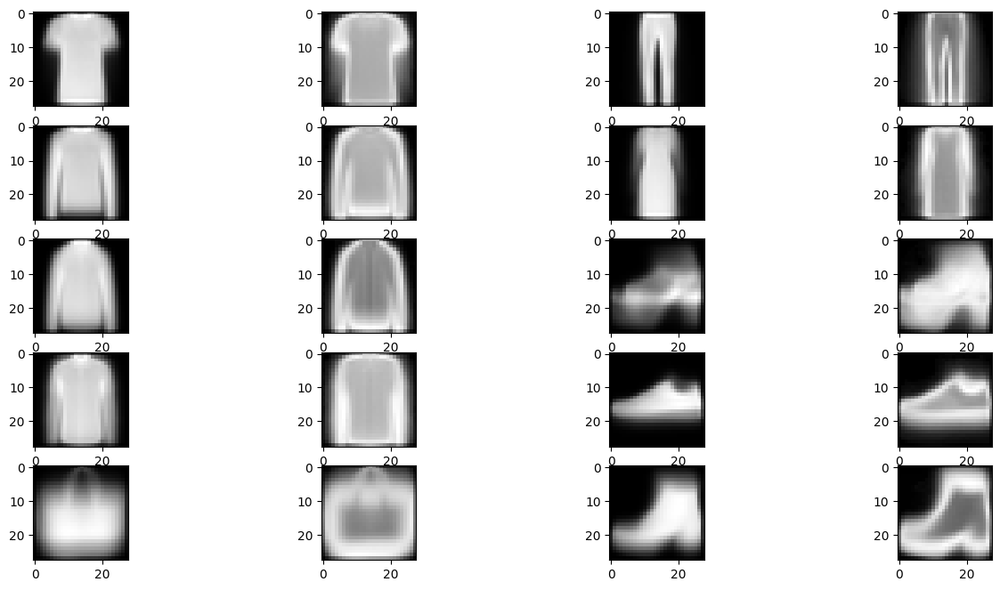

In [48]:
#Mean and Variance of all clases.
plt.figure(figsize=(16,8))
all_clases_mean = np.zeros([10,784])
all_clases_var = np.zeros([10,784])
for i in range(1,11):
    s_train = x_train[y_train.label.values == i-1, ...] 
    all_clases_mean[i-1] = s_train.mean(axis=0).flatten()
    all_clases_var[i-1] = s_train.std(axis=0).flatten()
    plt.subplot(5,4,2*i - 1)
    a = plt.imshow(s_train.mean(axis=0), cmap='gray')
    plt.subplot(5,4,2*i)
    b = plt.imshow(s_train.std(axis=0), cmap='gray')

Luego, se nos pide realizar un histograma de intensidades.

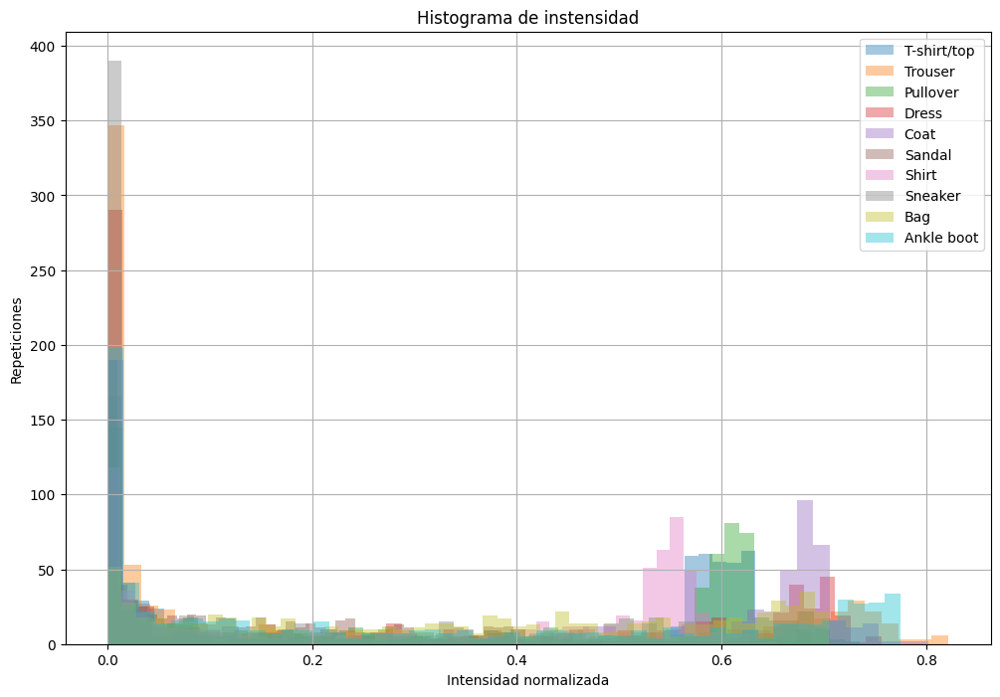

In [49]:
#Histograma de intensidades.
plt.figure(figsize=(12,8))
label_dict = {  0: "T-shirt/top",
                1: "Trouser",
                2: "Pullover",
                3: "Dress",
                4: "Coat",
                5: "Sandal",
                6: "Shirt",
                7: "Sneaker",
                8: "Bag",
                9: "Ankle boot"
             }
for i in range(10):
    plt.hist(all_clases_mean[i] , bins=50,label = label_dict[i],alpha = 0.4)
plt.legend()
plt.title("Histograma de instensidad")
plt.xlabel("Intensidad normalizada")
plt.ylabel("Repeticiones")
plt.grid(True)

In [174]:
#Chequeo si no hay imagenes en negro que podrian ocasionar errores al entrenar.
index_black_images = []
for i in range(x_train.shape[0]):
    if np.mean(x_train[i]) < 1e-2:
        index_black_images.append(i)
print(len(index_black_images))

0


Una vez corroborado que el set de entrada no posee datos corruptos, ahora podemos realizar un analisis con PCA (Principal Component Analysis), para dar por sentado el EDA de este dataset.

Tomando cada uno de los pixeles de nuestras imagenes como una dimensión, tenemos un total de 784 dimensiones que lógicamente es imposible de representar. Para ello, este análisis tiene en cuenta las primeras N dimensiones con mayor varianza entre cada una de las imagenes (Pues cada imagen es representada como un punto en espacio de 784 dimensiones). En definitiva, vamos a tomar las primeras 3 dimensiones para poder graficarlas y observar como se representan en el espacio. (Cabe destacar que con este algoritmo perdemos información, https://en.wikipedia.org/wiki/Principal_component_analysis)
Si ploteamos las primeras dos dimensiones obtenidas con dicho analisis, obtenemos el siguiente grafico.

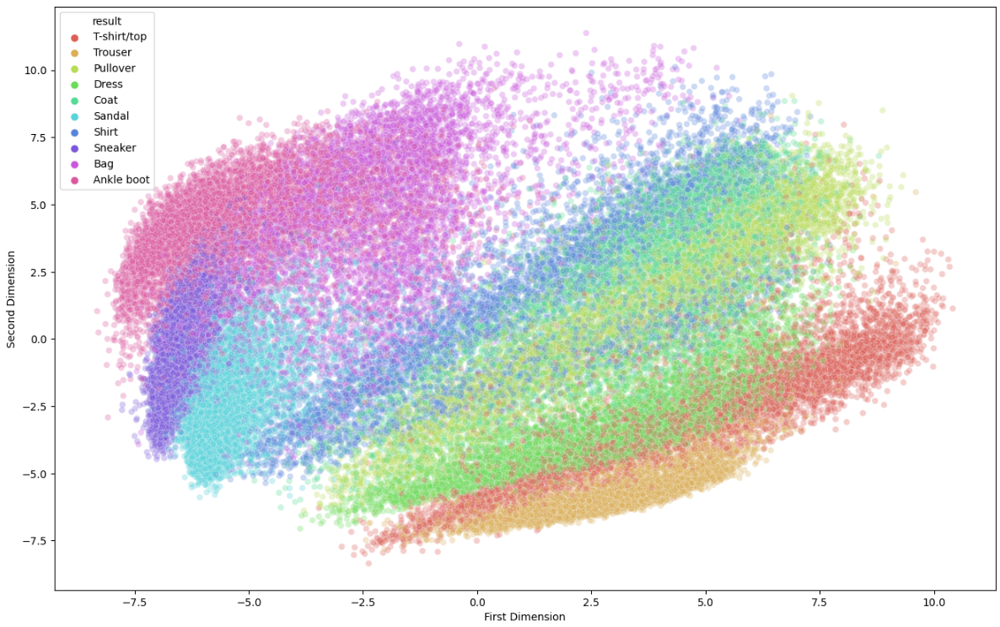

Finalmente, si queremos ver lo que ocurre con la tercera dimension, obtenemos el siguiente resultado.

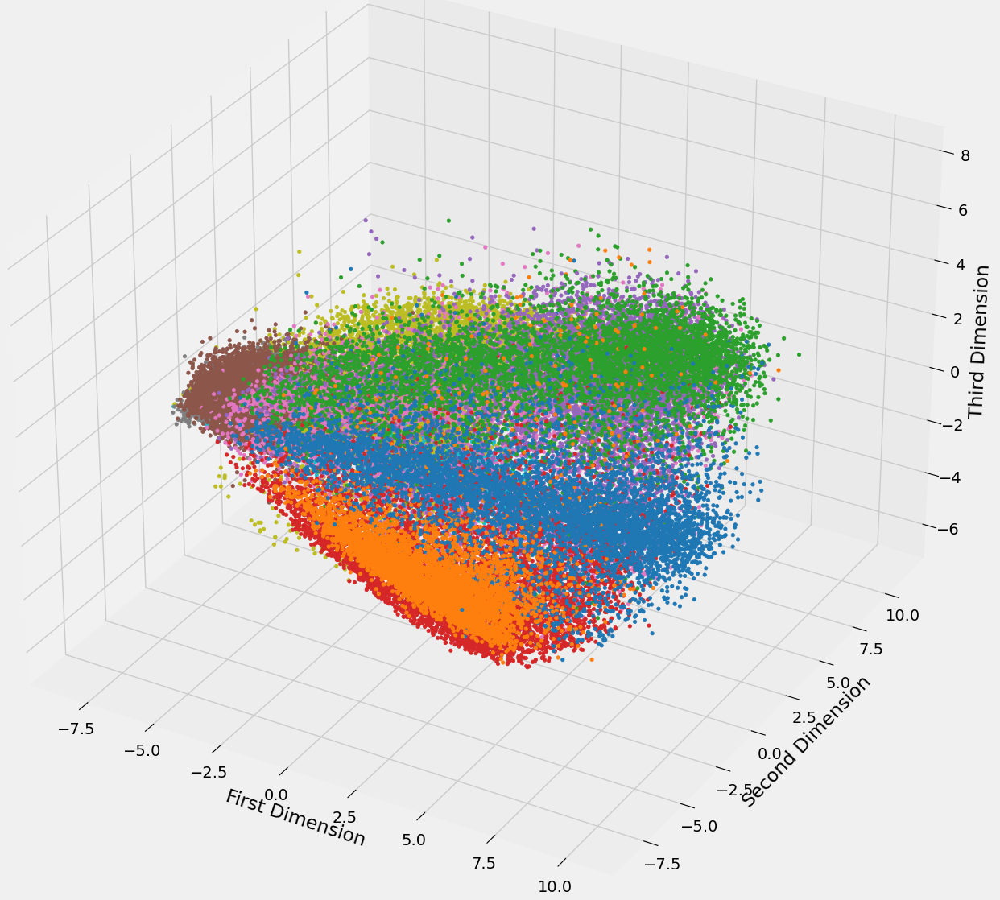

El código para obtener estas imagenes esta en PCA_Analysis.ipynb
***************

Una vez realizado el EDA correspondiente, como solo contamos con los datos de train dada la consigna, debemos segmentar estos datos para poder usarlos como train y como validation correspondientemente.

In [175]:
X_train_par, X_val_par, y_train_par, y_val_par = train_test_split(x_train, y_train['label'].values, test_size=0.15, random_state=42,shuffle = False)

Luego, dado que nuestra salida de la red va a ser un clasificador de 10 clases, necesitamos hacer el sparse de la data de y

In [176]:
#hay que hacer el sparse de Y para poder entrenar la red
y_sparse_train = np.zeros([y_train_par.size,10])
y_sparse_val = np.zeros([y_val_par.size,10])
for k in range(y_train_par.size):
    y_sparse_train[k,y_train_par[k]] = 1
for k in range(y_val_par.size):
    y_sparse_val[k,y_val_par[k]] = 1

***********************************************************************************************************************************************************
### Regresion SOFTMAX
***********************************************************************************************************************************************************

**Esta seccion fue corregida post clase 21/05 dado que tenia un concepto erroneo, no obstante se deja evidencia del trabajo que se hizo con esta red**

Luego de haber entrenado varios modelos, podemos observar que el que mejor funciona de ellos es el que comienza con 1024 neuronas con funcion de activacion relu luego de la capa flatten.

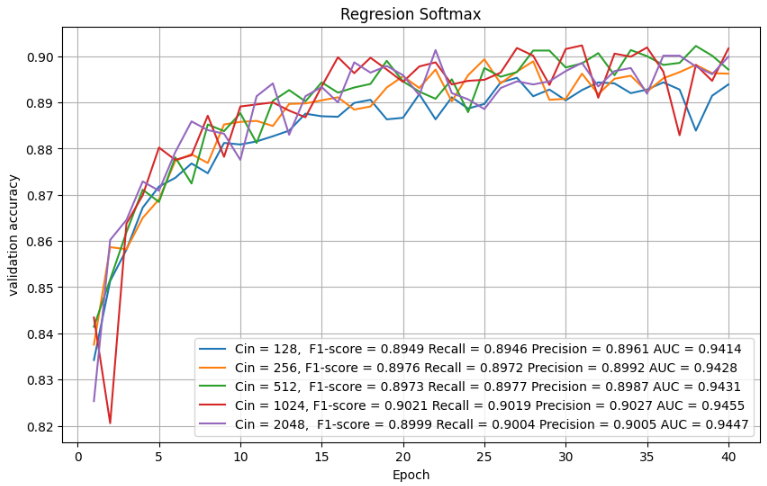

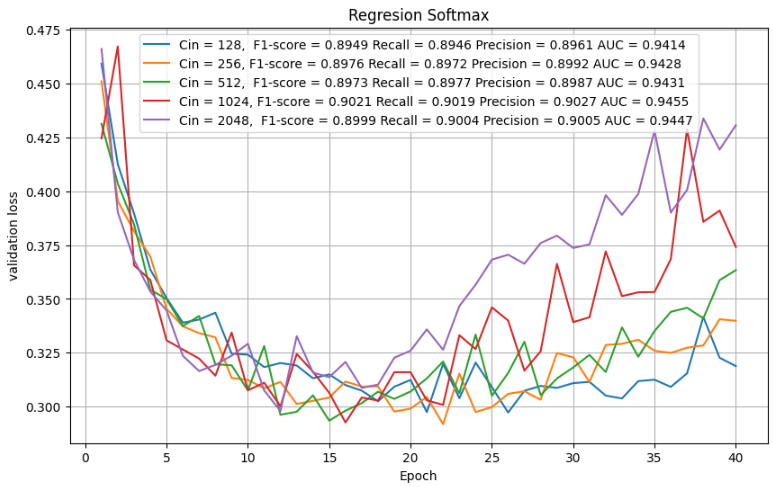

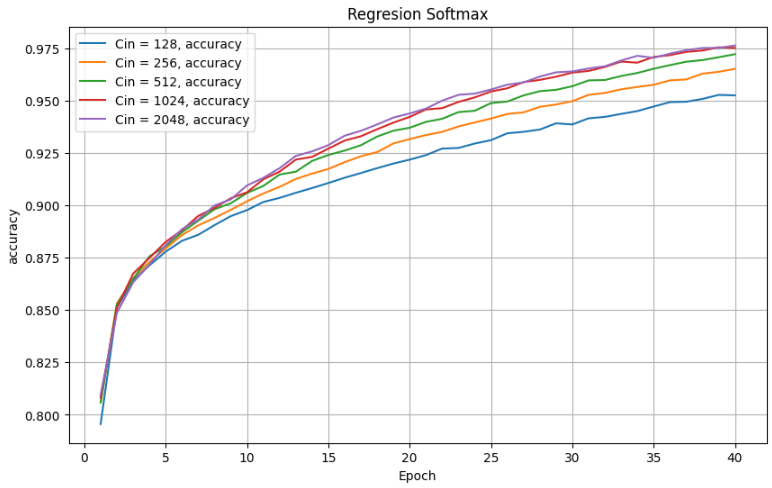

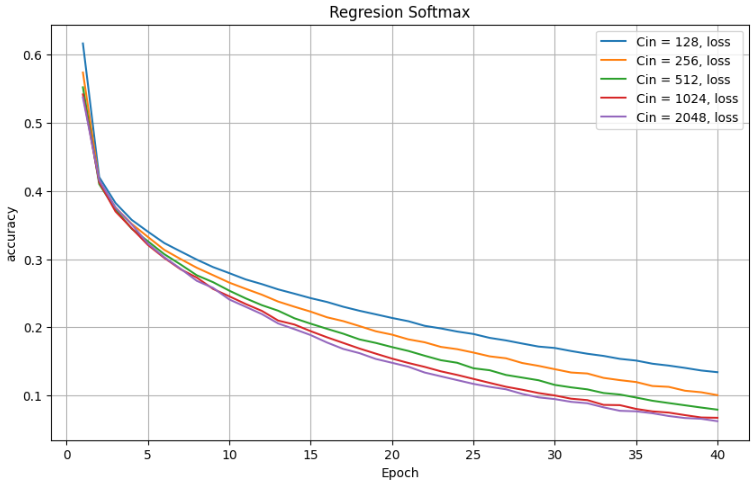

Cada uno de los test se realizo variando los parametros solicitados por la catedra, aqui solo se muestran cinco modelos que fueron los que mejor performance lograron.

Se deja a continuación un ejemplo de como se testearon y hallaron los correspondientes datos junto a su explicación.

Ahora vamos a realizar un nuevo modelo puramente softmax, no obstante se deja la capa flatten para comodidad a la hora de establecer el input

In [11]:
modelSoftMax = Sequential()

In [12]:
modelSoftMax.add(Flatten(input_shape=(28,28)))
modelSoftMax.add(Dense(10, activation='softmax',kernel_initializer='glorot_normal'))

In [13]:
modelSoftMax.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 10)                7850      
                                                                 
Total params: 7,850
Trainable params: 7,850
Non-trainable params: 0
_________________________________________________________________


In [14]:
learning_rate_choice = 0.001
numEpoch = 40
batch_size = 64
modelSoftMax.compile(loss = "categorical_crossentropy",optimizer=Nadam(learning_rate=learning_rate_choice), metrics = ["accuracy"])

In [15]:
history = modelSoftMax.fit(X_train_par, y_sparse_train,
                  batch_size=batch_size,
                  epochs=numEpoch,
                  verbose=1,
                  validation_data=(X_val_par, y_sparse_val))

Epoch 1/40
797/797 [==============================] - 2s 1ms/step - loss: 0.6849 - accuracy: 0.7731 - val_loss: 0.5227 - val_accuracy: 0.8204
Epoch 2/40
797/797 [==============================] - 1s 1ms/step - loss: 0.4908 - accuracy: 0.8355 - val_loss: 0.4724 - val_accuracy: 0.8366
Epoch 3/40
797/797 [==============================] - 1s 1ms/step - loss: 0.4552 - accuracy: 0.8448 - val_loss: 0.4618 - val_accuracy: 0.8428
Epoch 4/40
797/797 [==============================] - 1s 1ms/step - loss: 0.4360 - accuracy: 0.8516 - val_loss: 0.4428 - val_accuracy: 0.8494
Epoch 5/40
797/797 [==============================] - 1s 1ms/step - loss: 0.4243 - accuracy: 0.8553 - val_loss: 0.4363 - val_accuracy: 0.8496
Epoch 6/40
797/797 [==============================] - 1s 1ms/step - loss: 0.4155 - accuracy: 0.8569 - val_loss: 0.4301 - val_accuracy: 0.8516
Epoch 7/40
797/797 [==============================] - 1s 1ms/step - loss: 0.4089 - accuracy: 0.8596 - val_loss: 0.4263 - val_accuracy: 0.8538
Epoch 

***********************************************************************************************************************************************************
                                                         Ploteo de datos de interes
***********************************************************************************************************************************************************

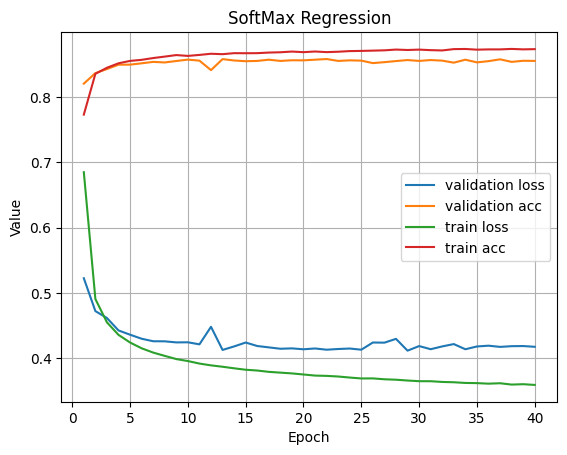

In [18]:
plot_train(history)

***********************************************************************************************************************************************************
                                                                      F1-RECALL-PRECISION
***********************************************************************************************************************************************************
Ahroa vamos a calcular el F1-score, y como tenemos mas de dos clases, necesitamos establecer el tipo de average necesario para calcular este parámetro de interes.

Dado que en este caso tenemos un set de datos no balanceado, pues en lineas anteriores hicimos un split de la data de train para lograr tener un set de validacion. Entonces nos es conveninete hacer uso del macro average del F1-Score. Asi tambien ocurre con el precision y recall.



In [19]:
f1_macro,precision,recall = get_f1_prec_recall(modelSoftMax,X_val_par,y_val_par)

282/282 [==============================] - 0s 762us/step
 Precision: 	 0.8560520910197779 
 Recall: 	 0.8560666783984441
 F1 Macro: 	 0.8557831282219757 
 F1 Micro: 	 0.8552222222222222 
 F1 Weihtged:  0.8550050144418774


***********************************************************************************************************************************************************
                                                                       Curva ROC 
***********************************************************************************************************************************************************

282/282 [==============================] - 0s 772us/step


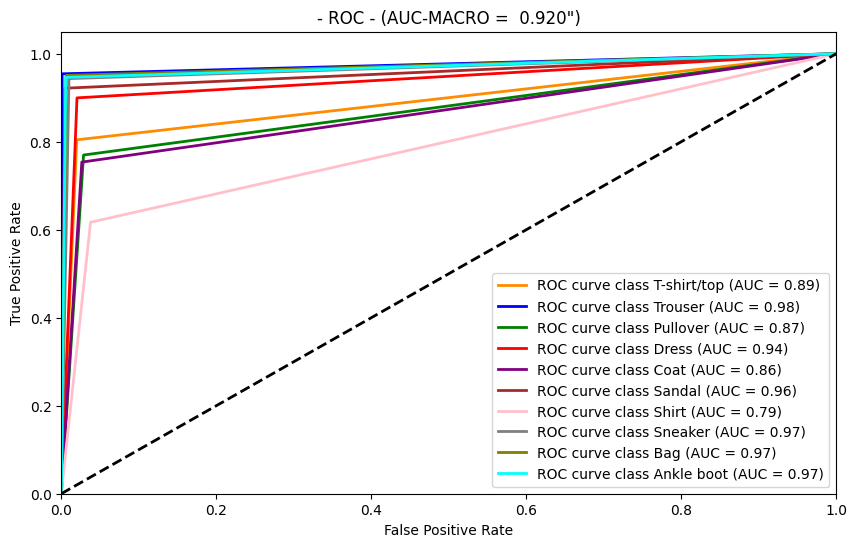

Macro averege of the AUC value:  0.92


In [20]:
aucx = ROC_curve(modelSoftMax,X_val_par,y_val_par)

***********************************************************************************************************************************************************
                                                                       Save on csv 
***********************************************************************************************************************************************************

In [ ]:
save2csv(history,f1_macro,recall,precision,aucx,'RS_L_'+str(const)+'.csv')
const+=1

***********************************************************************************************************************************************************
### MLP 
***********************************************************************************************************************************************************

Al igual que en el caso de regresion softmax, aqui vemos la comparacion de los cinco modelos que mejor performaron de todos los que se testearon.

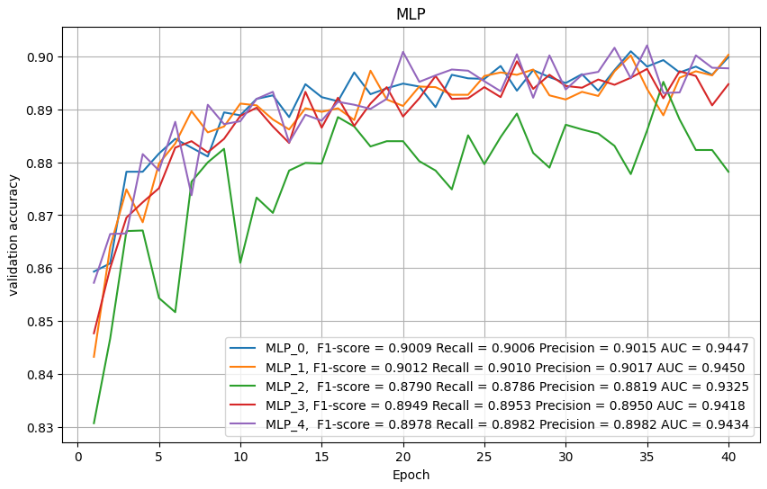

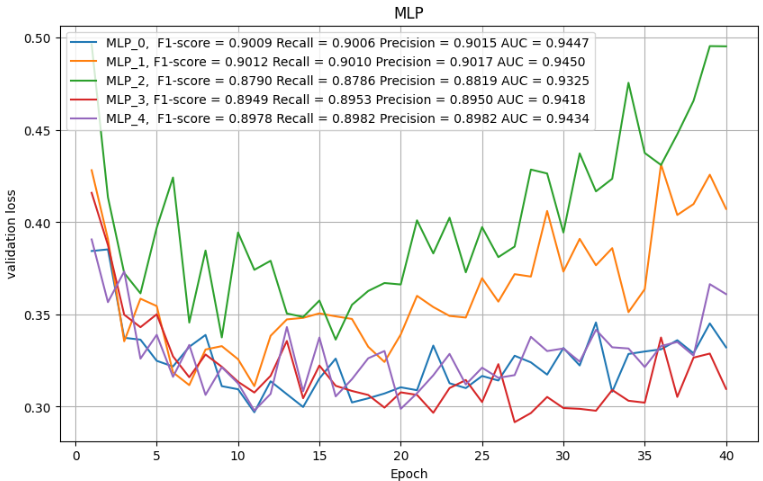

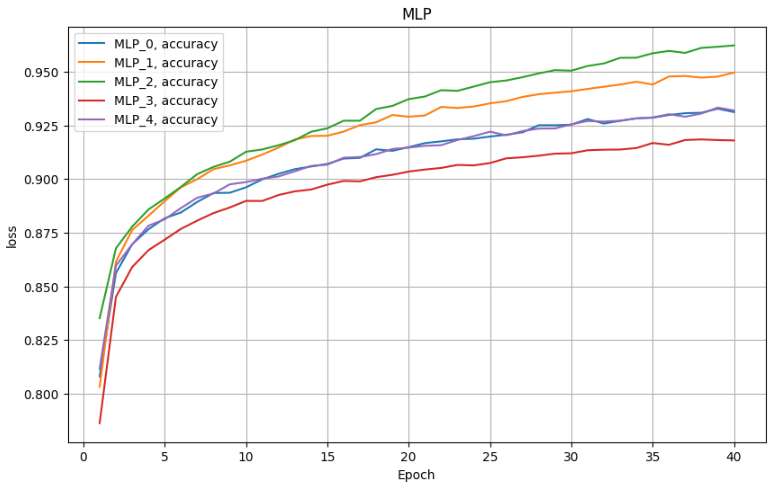

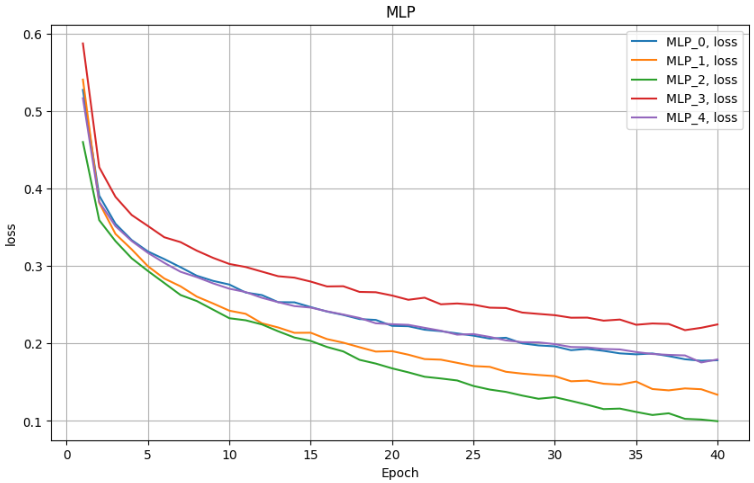

Donde en el archivo trainMLP.txt tenemos la distintas configuraciones con su correspondiente indices.

A priori no se observan grandes diferencias, pero en teniendo en cuenta el tiempo de entrenamiento y la tendencia de las curvas, se decidio por tomar el modelo MLP_3.
 
Como en el caso anterior, se deja a continuacion el modelo de testeo que se fue ejecutando para obtener los resultados de los graficos anteriores.



In [ ]:
optimizer='nadam'
activation='relu'
units=256 
dropOut=0.25
pesoInit=None
model = Sequential()
model.add(Flatten(input_shape=(28, 28, 1)))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
model.add(Dropout(dropOut))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
model.add(Dropout(dropOut))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
model.add(Dropout(dropOut))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
model.add(Dense(10, activation='softmax',kernel_initializer=pesoInit))

In [ ]:
model.summary()

In [ ]:
learning_rate_choice = 0.001
numEpoch = 40
batch_size = 64
model.compile(loss = "categorical_crossentropy",optimizer=optimizer, metrics = ["accuracy"])
history = model.fit(X_train_par, y_sparse_train,
                  batch_size=batch_size,
                  epochs=numEpoch,
                  verbose=1,
                  validation_data=(X_val_par, y_sparse_val))

In [ ]:
plot_train(history)

In [ ]:
f1_macro,precision,recall = get_f1_prec_recall(model,X_val_par,y_val_par)

In [ ]:
aucx = ROC_curve(model,X_val_par,y_val_par)

In [ ]:
save2csv(history,f1_macro,recall,precision,aucx,'MLP_'+str(const)+'.csv')
const+=1

******
******
                    Seleccionamos el modelo MLP_3 para seguir desarrollando el informe.
***
***

#### Funciones utiles para MLP
Definimos las funciones para crear el modelo en cuestion como asi tambien para compilarlo y entrenarlo.

A su vez, vamos a añadir early stopping para poder frenar el entrenamiento si es que hubo overfitting.

In [150]:

callback = EarlyStopping(monitor='val_loss',min_delta=0, patience=10,restore_best_weights=True)

def create_MLP_model(activation,units,dropOut,pesoInit):
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28, 1)))
    model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
    model.add(Dropout(dropOut))
    model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
    model.add(Dropout(dropOut))
    model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
    model.add(Dropout(dropOut))
    model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
    model.add(Dense(10, activation='softmax',kernel_initializer=pesoInit))
    
    return model

def compile_MLP_model(model,learning_rate_choice,lossFunc,optimizer,x_train,y_train,x_val,y_val,numEpoch,batch_size,metric):
    if optimizer == 'nadam':
        model.compile(loss = lossFunc,optimizer=Nadam(learning_rate=learning_rate_choice), metrics = [metric])
    elif optimizer == 'adam':
        model.compile(loss = lossFunc,optimizer=Adam(learning_rate=learning_rate_choice), metrics = [metric])
    elif optimizer == 'adamax':
        model.compile(loss = lossFunc,optimizer=Adamax(learning_rate=learning_rate_choice), metrics = [metric])
    elif optimizer == 'sgd':
        model.compile(loss = lossFunc,optimizer=SGD(learning_rate=learning_rate_choice), metrics = [metric])
    elif optimizer == 'adadelta':
        model.compile(loss = lossFunc,optimizer=Adadelta(learning_rate=learning_rate_choice), metrics = [metric])  
    elif optimizer == 'rmsprop':
        model.compile(loss = lossFunc,optimizer=RMSprop(learning_rate=learning_rate_choice), metrics = [metric])  
    
    return model.fit(x_train, y_train,
                      batch_size=batch_size,
                      epochs=numEpoch,
                      verbose=1,
                      validation_data=(x_val, y_val),
                      callbacks=[callback])

***
Lo que primero vamos a variar es el learning rate dejando todo lo demas sin modificar.

In [ ]:
cant_iter = 10
acc = np.zeros(cant_iter)
lra = np.zeros(cant_iter)
hist = []
metric = "accuracy"
for i in range(cant_iter):
    
    optimizer='nadam'
    activation='relu'
    units=256 
    dropOut=0.25
    pesoInit=None
    learning_rate_choice = 0.01*np.exp(-0.4*i)
    numEpoch = 50
    batch_size = 128
    
    model = create_MLP_model(activation,units,dropOut,pesoInit)
    
    history  = compile_MLP_model(model = model,
                                 learning_rate_choice=learning_rate_choice,
                                 lossFunc='categorical_crossentropy',
                                 optimizer=optimizer,
                                 x_train=X_train_par,
                                 y_train=y_sparse_train,
                                 x_val=X_val_par,
                                 y_val = y_sparse_val,
                                 numEpoch= numEpoch,
                                 batch_size=batch_size,
                                 metric=metric)
                            
    hist.append(history)
    acc[i] = history.history['val_accuracy'][-1]
    lra[i] = learning_rate_choice
    print(acc[i] , lra[i])

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = lra, y = acc, label = 'Epochs = %d BatchSize = %d DropOut = %0.2f \n Optm: %s  Actv: %s   InitPesos: %s' %(numEpoch,batch_size,dropOut,optimizer,activation,pesoInit))
plt.xlabel("Learnign Rate")
plt.ylabel("Validation accuracy")
plt.title("Acc vs Lr")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12, 8))
for i in range(cant_iter):
    sns_val_acc(hist[i],i,lra[i])
    
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.grid()
plt.show()    

Los resultado obtenidos, son los siguientes.

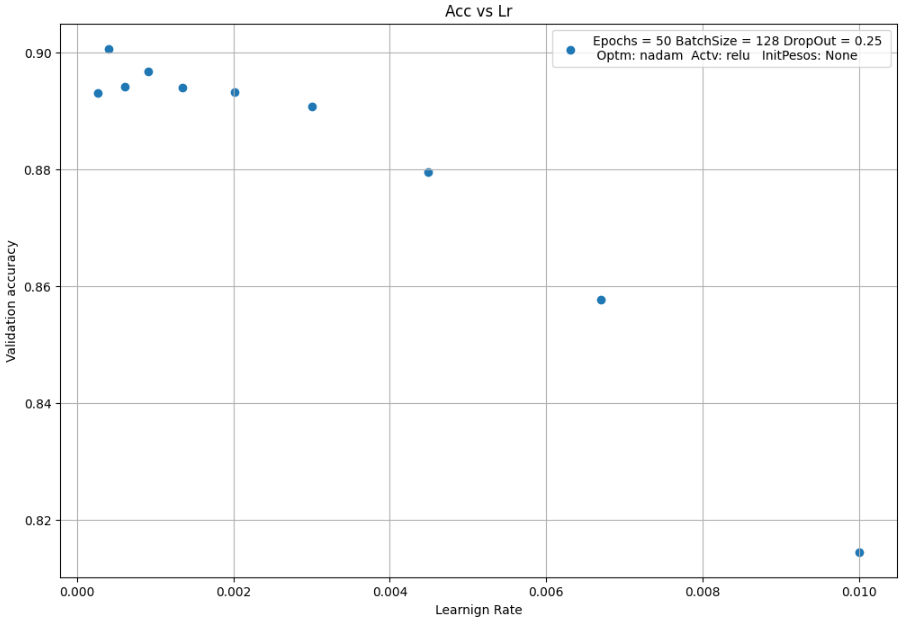

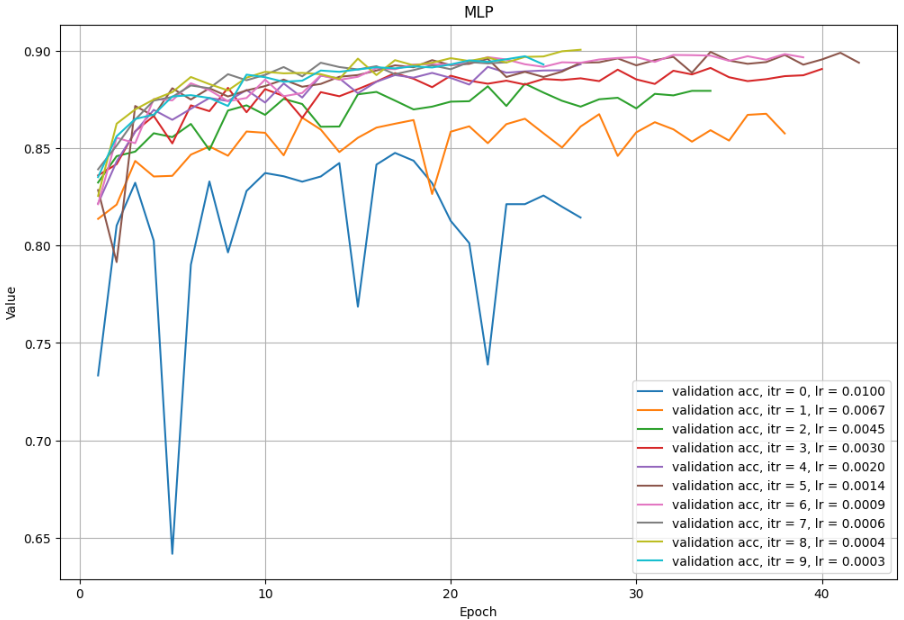

Entonces de esta variacion de hiperparametro, obtenemos que el learning rate obtimo para este dataset, sera de 0.0004 aprox. Luego se observa que es demasiado pequeño para poder aprender algo, es por esto  último que en el primer grafico observamos que para $lr<0.0004$ el accuarcy empieza a decaer. 
***

***
Ahora vamos a variar el batch size.

In [ ]:
cant_iter = 10
acc = np.zeros(10)
bs = np.zeros(10)
hist = []
for i in range(cant_iter):
    optimizer='nadam'
    activation='relu'
    units=256 
    dropOut=0.25
    pesoInit=None
    learning_rate_choice =0.0004
    numEpoch = 40
    batch_size = 8 * (2**i)
    
    model = create_MLP_model(activation,units,dropOut,pesoInit)
    
    history  = compile_MLP_model(model = model,
                                 lossFunc='categorical_crossentropy',
                                 learning_rate_choice=learning_rate_choice,
                                 optimizer=optimizer,
                                 x_train=X_train_par,
                                 y_train=y_sparse_train,
                                 x_val=X_val_par,
                                 y_val = y_sparse_val,
                                 numEpoch= numEpoch,
                                 batch_size=batch_size,
                                 metric=metric)
    hist.append(history)
    acc[i] = history.history['val_accuracy'][-1]
    bs[i] = batch_size
    print(acc[i] , bs[i])

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = np.log2(bs), y = acc, label = 'Epochs = %d lr = %0.4f DropOut = %0.2f \n Optm: %s  Actv: %s   InitPesos: %s' %(numEpoch,learning_rate_choice,dropOut,optimizer,activation,pesoInit))
plt.xlabel("Batch Size ($2^n$)")
plt.ylabel("Validation accuracy")
plt.title("Acc vs Bs")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12, 8))
for i in range(cant_iter):
    sns_val_acc(hist[i],i,bs[i])
    
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.grid()
plt.show()    

Los resultado obtenidos, son los siguientes.

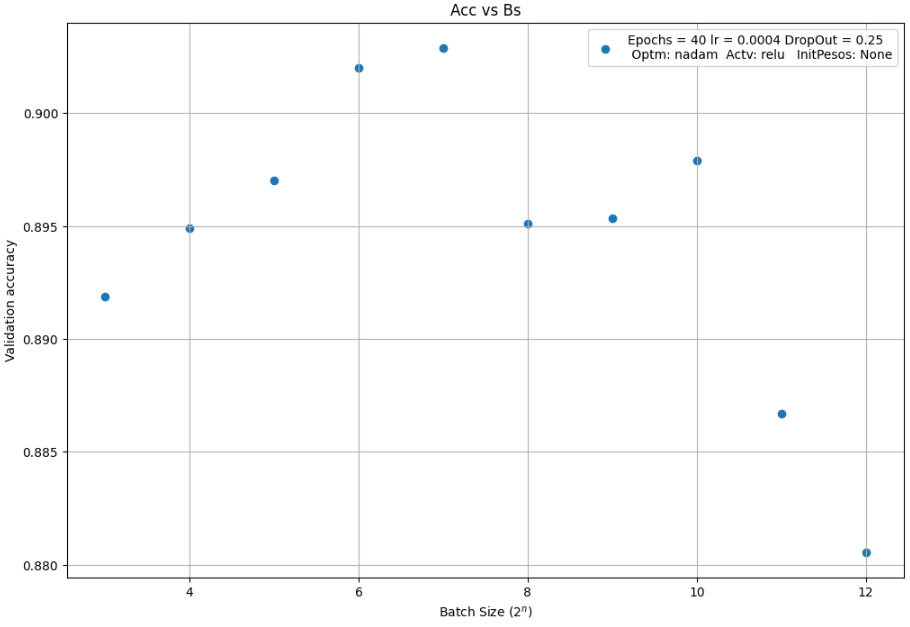

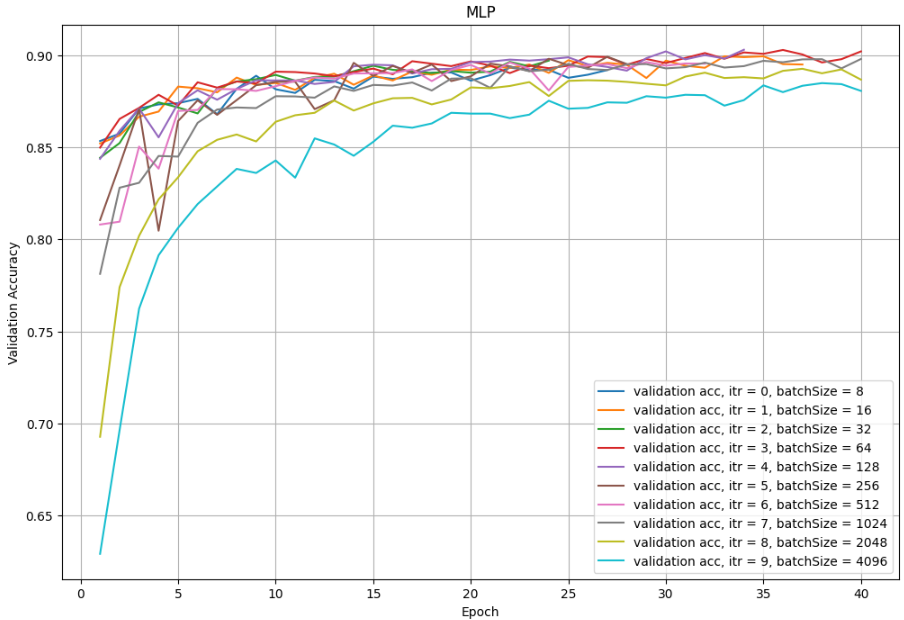

En principio, nos conviene que el temaño de batchsize sea de 128 pues no tan solo tarda menos en entrenarse, si que tambien llega a un nivel de accuracy mayor al resto de tries.
***

***
    Ahora vamos a variar el optimizador. (Hasta ahora se vino usando Nadam por la cantidad de ceros que se observo en el EDA)
    

In [ ]:
cant_iter = 6
acc = np.zeros(6)
opt = ['adam','adamax','nadam','sgd','adadelta','rmsprop']
hist = []
for i in range(cant_iter):
    activation='relu'
    units=256 
    dropOut=0.25
    pesoInit=None
    learning_rate_choice =0.0004
    numEpoch = 50
    batch_size = 128
    
    model = create_MLP_model(activation,units,dropOut,pesoInit)
    
    history  = compile_MLP_model(model = model,
                                 learning_rate_choice=learning_rate_choice,
                                 lossFunc='categorical_crossentropy',
                                 optimizer=opt[i],
                                 x_train=X_train_par,
                                 y_train=y_sparse_train,
                                 x_val=X_val_par,
                                 y_val = y_sparse_val,
                                 numEpoch= numEpoch,
                                 batch_size=batch_size)
    
    hist.append(history)
    acc[i] = history.history['val_accuracy'][-1]
    print(acc[i] , opt[i])

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = opt , y = acc, label = 'lr = %0.4f batchSize = %d DropOut = %0.2f \n Actv: %s   InitPesos: %s' %(learning_rate_choice,batch_size,dropOut,activation,pesoInit))
plt.xlabel("Optimizer funct")
plt.ylabel("Validation accuracy")
plt.title("Acc vs opt")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12, 8))
for i in range(cant_iter):
    sns_val_acc(hist[i],i,opt[i])
    
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.grid()
plt.show()    

Los resultados son los siguiente:

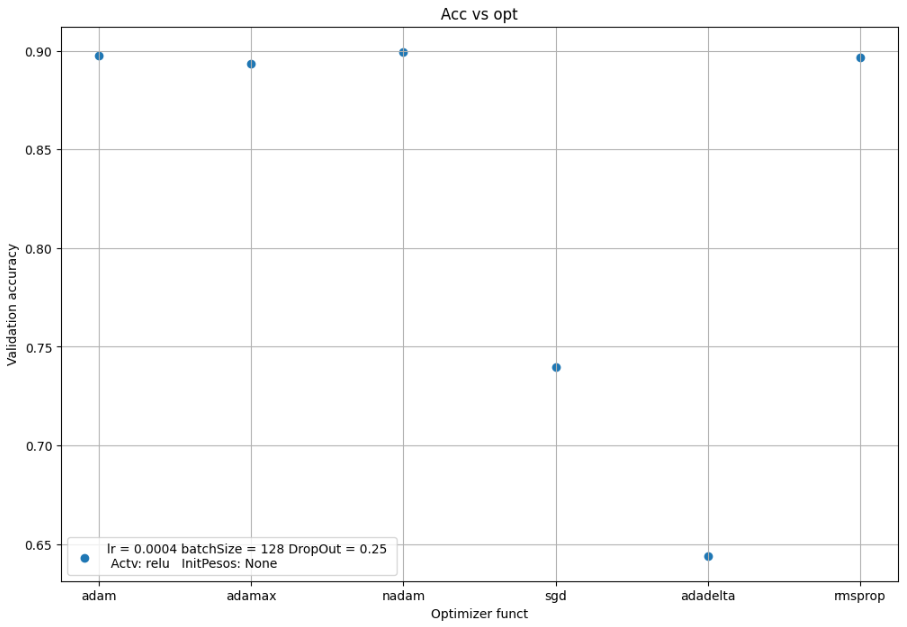

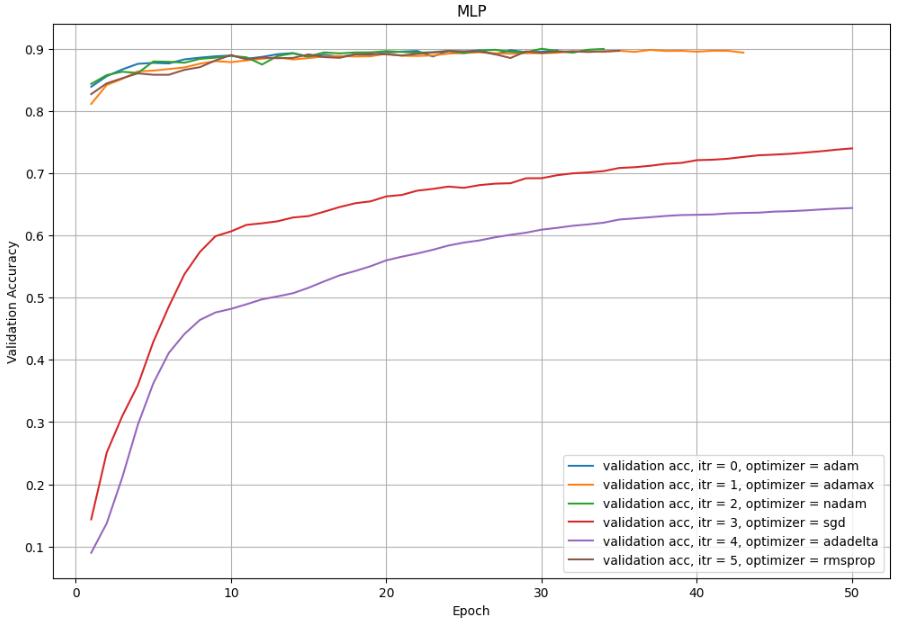

Como lo que habiamos visto en la teoria, dada las condiciones del dataset, fue de esperar que el mejor optimizador fue nadam.

***

***
    Ahora vamos a variar la funcion de activacion de las neuronas.
    

In [ ]:
cant_iter = 5
acc = np.zeros(5)
activation = ['relu','selu','tanh','sigmoid','elu']
hist = []
for i in range(cant_iter):
    optimizer='nadam'
    units=256 
    dropOut=0.25
    pesoInit=None
    learning_rate_choice =0.0004
    numEpoch = 50
    batch_size = 128
    
    model = create_MLP_model(activation[i],units,dropOut,pesoInit)
    
    history  = compile_MLP_model(model = model,
                                 learning_rate_choice=learning_rate_choice,
                                 lossFunc='categorical_crossentropy',
                                 optimizer=optimizer,
                                 x_train=X_train_par,
                                 y_train=y_sparse_train,
                                 x_val=X_val_par,
                                 y_val = y_sparse_val,
                                 numEpoch= numEpoch,
                                 batch_size=batch_size)
    
    hist.append(history)
    acc[i] = history.history['val_accuracy'][-1]
    print(acc[i] , activation[i])

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = activation , y = acc, label = 'Epochs = %d lr = %0.4f batchSize = %d DropOut = %0.2f \n Optm: %s  InitPesos: %s' %(numEpoch,learning_rate_choice,batch_size,dropOut,optimizer,pesoInit))
plt.xlabel("Activation funct")
plt.ylabel("Validation accuracy")
plt.title("Acc vs act")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12, 8))
for i in range(cant_iter):
    sns_val_acc(hist[i],i,activation[i])
    
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.grid()
plt.show()    

Los resultados fueron.

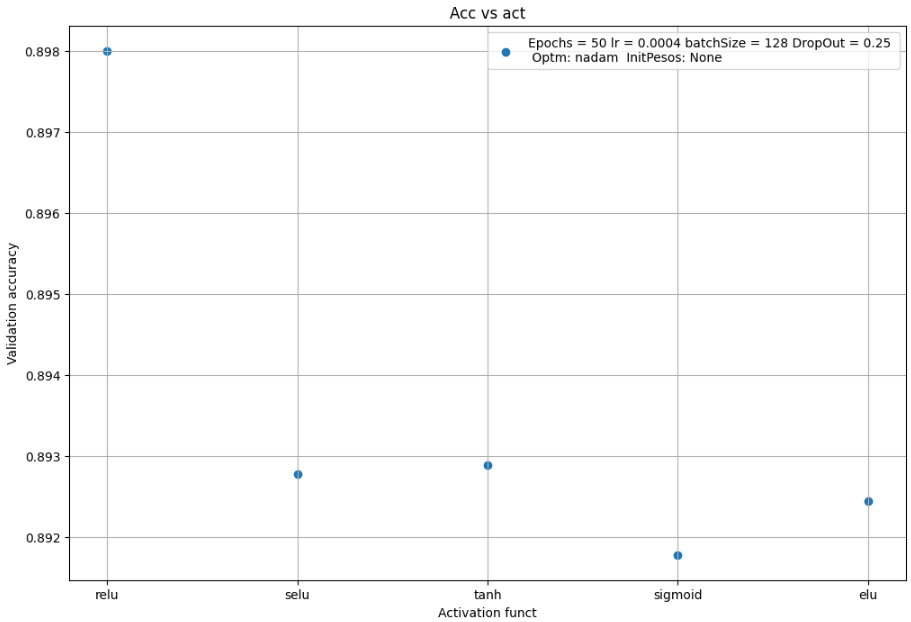

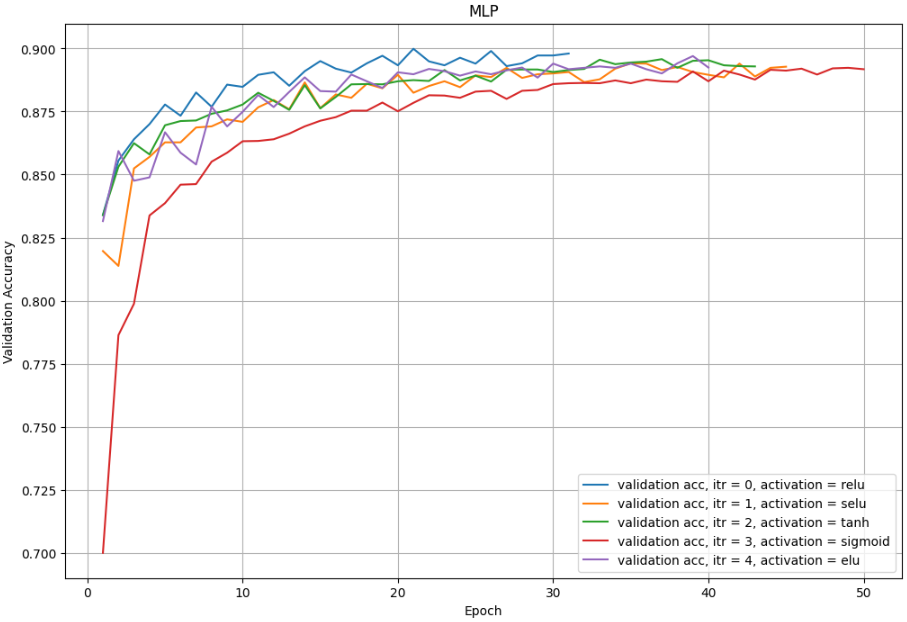

Como se puede observar, al que mejor performa es la activacion relu.
***

***
Ahora vamos a variar el dropOut rate.

In [ ]:
cant_iter = 10
acc = np.zeros(10)
do= np.zeros(10)
hist = []
for i in range(cant_iter):
    activation = 'relu'
    optimizer = 'nadam'
    
    units=256 
    dropOut=0.1 + 0.05*i
    pesoInit=None
    learning_rate_choice =0.0004
    numEpoch = 50
    batch_size = 128
    
    model = create_MLP_model(activation,units,dropOut,pesoInit)
    
    history  = compile_MLP_model(model = model,
                                 learning_rate_choice=learning_rate_choice,
                                 lossFunc='categorical_crossentropy',
                                 optimizer=optimizer,
                                 x_train=X_train_par,
                                 y_train=y_sparse_train,
                                 x_val=X_val_par,
                                 y_val = y_sparse_val,
                                 numEpoch= numEpoch,
                                 batch_size=batch_size,
                                 metric=metric)
    hist.append(history)
    acc[i] = history.history['val_accuracy'][-1]
    do[i] = dropOut
    print(acc[i] ,dropOut)

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = do , y = acc , label = 'Epochs = %d lr = %0.4f batchSize = %d DropOut = %0.2f \n Optm: %s  Actv: %s   InitPesos: %s' %(numEpoch,learning_rate_choice,batch_size,dropOut,optimizer,activation,pesoInit))
plt.xlabel("DropOut rate")
plt.ylabel("Validation accuracy")
plt.title("Acc vs Dpout")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12, 8))
for i in range(cant_iter):
    sns_val_acc(hist[i],i,do[i])
    
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.grid()
plt.show()   

Resultados:

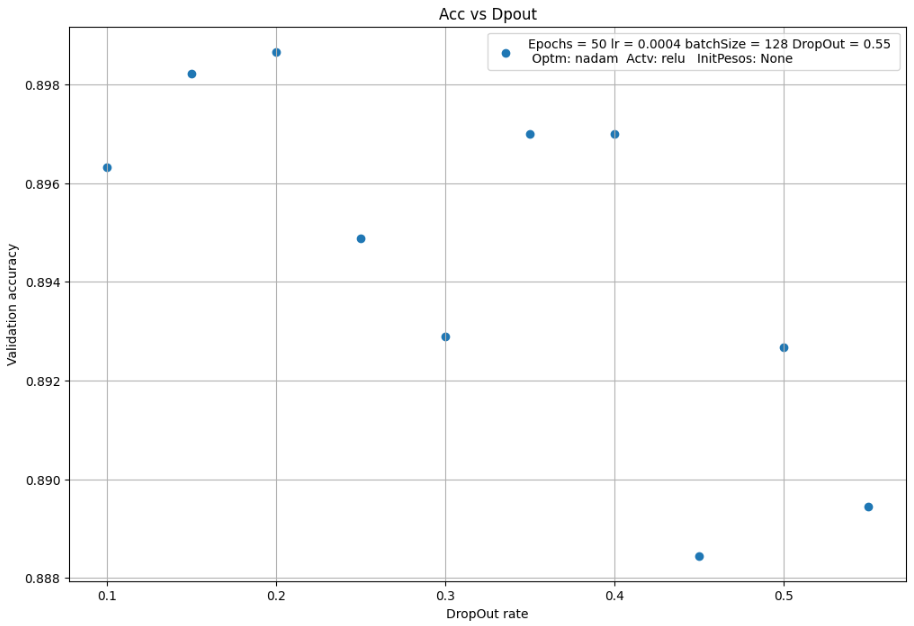
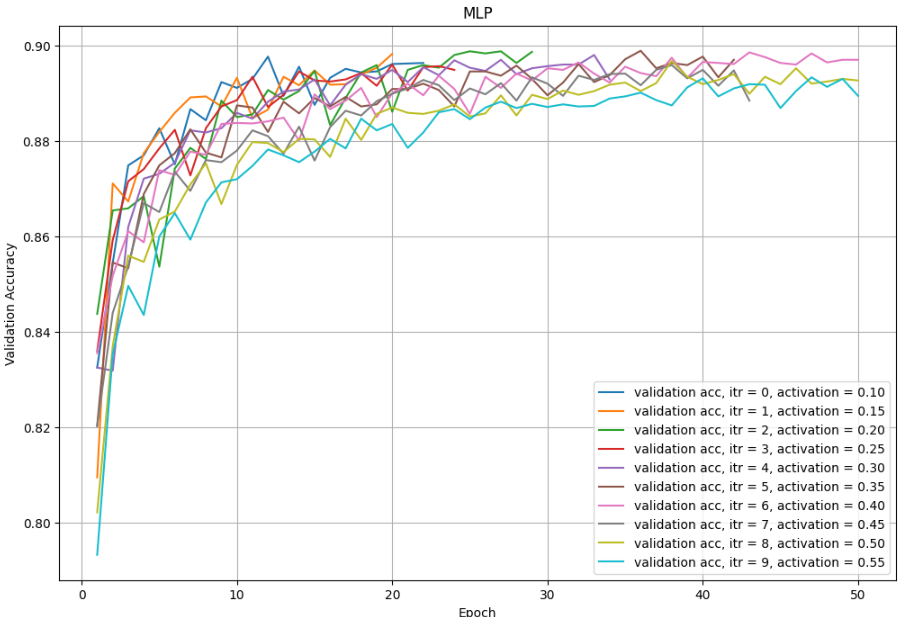

Vemos que el mejor dropOut rate es 0.2, ya que presenta una convergencai al valor mayor de val accuracy en bastantes menos epochs que el resto.
***

***
Finalizamos variando las inicializacion de los pesos

In [ ]:
cant_iter = 4
acc = np.zeros(4)
pesoInit= ['glorot_uniform','glorot_normal','uniform','normal']
hist = []
for i in range(cant_iter):
    activation = 'relu'
    optimizer = 'nadam'
    units=256 
    dropOut=0.2
    learning_rate_choice =0.0004
    numEpoch = 50
    batch_size = 128
    
    model = create_MLP_model(activation,units,dropOut,pesoInit[i])
    
    history  = compile_MLP_model(model = model,
                                 learning_rate_choice=learning_rate_choice,
                                 lossFunc='categorical_crossentropy',
                                 optimizer=optimizer,
                                 x_train=X_train_par,
                                 y_train=y_sparse_train,
                                 x_val=X_val_par,
                                 y_val = y_sparse_val,
                                 numEpoch= numEpoch,
                                 batch_size=batch_size,
                                 metric=metric)
    hist.append(history)
    acc[i] = history.history['val_accuracy'][-1]
    print(acc[i] ,pesoInit[i])

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = pesoInit , y = acc, label = 'Epochs = %d lr = %0.4f batchSize = %d DropOut = %0.2f \n Optm: %s  Actv: %s   InitPesos: %s' %(numEpoch,learning_rate_choice,batch_size,dropOut,optimizer,activation,pesoInit))
plt.xlabel("Init weight")
plt.ylabel("Validation accuracy")
plt.title("Acc vs IW")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12, 8))
for i in range(cant_iter):
    sns_val_acc(hist[i],i,pesoInit[i])
    
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.grid()
plt.show()   

Resultados:

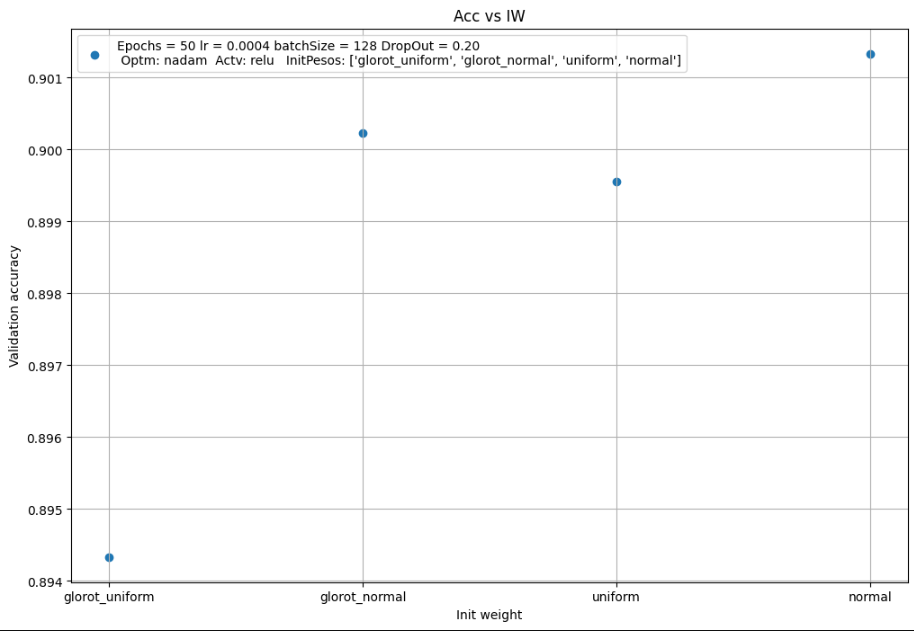

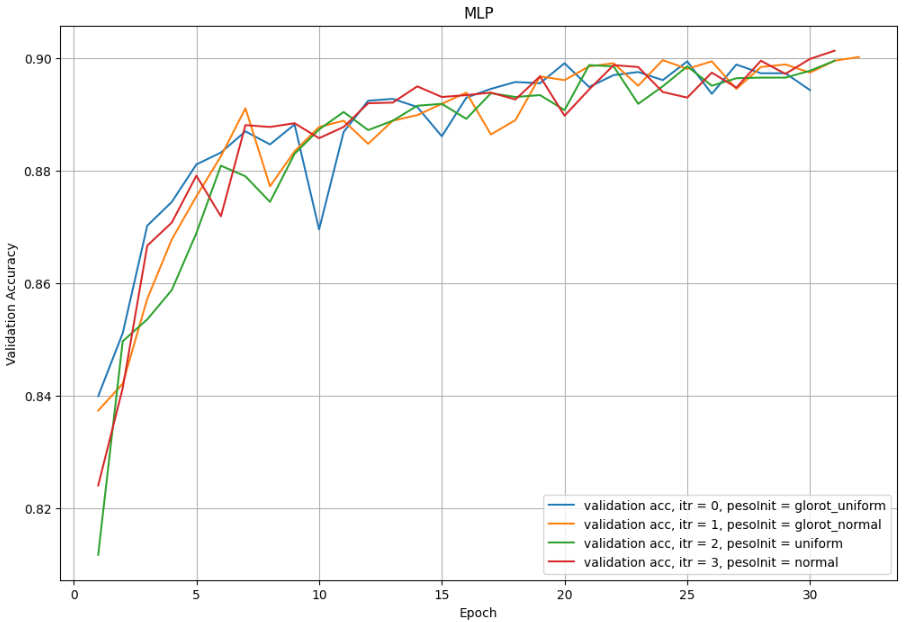

En definitiva, si bien la diferencia no es sustancial, la mejor es la inicializacion normal.

***

#### Resumen de mejores hiperparametros para el modelo elegido.
Finalmente, el mejor modelo que se obtuvo fue con los siguientes hiperparametros.

    -Optimizador: Nadam  (Comentario, si bien no es el que mayor accuracy nos da, no tenia tanto overfitting como los otros.)
    -pesoInit: normal
    -dropOut: 0.2
    -activation funct: relu
    -loss: categorical crossentropy (Esto es por definicion vista en clase.)
    -Batch Size: 128
    -learning rate: 0.0004



#### Ploteo de umbral de decision.
Ahora que hemos terminado de elegir un buen conjunto de hiperparametros, nos toca realizar la matriz de confusion, salvo que como este caso no es binario, se realiza de la siguiente forma.

Añadimos una capa previa a la última que posea la cantidad de salidas como dimensiones querramos mostrar, en este caso N=2. Luego, entrenamos la red de vuelta y mapeamos los datos de la entrada a la salida de dicha capa. Finalmente, para obtener la grilla donde se encuentran señalizados los umbrales de detección, solo es necesario darle commo input a la última capa (la que tiene activación softmax), para poder asignarle su correspondiente valor a la salida. Este algoritmo se encuantra desarrollado a continuación para la red con la que se viene desarrollando el informe.

In [23]:
activation = 'relu'
units=256 
dropOut=0.2
pesoInit = 'normal'

model = Sequential()

model.add(Flatten(input_shape=(28, 28, 1)))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
model.add(Dropout(dropOut))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
model.add(Dropout(dropOut))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))
model.add(Dropout(dropOut))
model.add(Dense(units, activation=activation,kernel_initializer=pesoInit))

model.add(Dense(2, activation='linear',kernel_initializer=pesoInit)) #Capa añadida para poder plotear luego el grafico con los umbrales de decision.

model.add(Dense(10, activation='softmax',kernel_initializer=pesoInit))

learning_rate_choice =0.0004
numEpoch = 200 #aumento la cantidad de epochs pues se añadio otra capa lo cual ralentiza el entrenamiento.
batch_size = 256
model.compile(loss = "categorical_crossentropy",optimizer=Nadam(learning_rate=learning_rate_choice), metrics = ["accuracy"])
history = model.fit(X_train_par, y_sparse_train,
                  batch_size=batch_size,
                  epochs=numEpoch,
                  verbose=1,
                  validation_data=(X_val_par, y_sparse_val),
                  callbacks=[callback])


Epoch 1/200
200/200 [==============================] - 3s 9ms/step - loss: 1.4085 - accuracy: 0.4261 - val_loss: 1.0147 - val_accuracy: 0.6293
Epoch 2/200
200/200 [==============================] - 2s 8ms/step - loss: 0.8661 - accuracy: 0.6710 - val_loss: 0.8060 - val_accuracy: 0.7042
Epoch 3/200
200/200 [==============================] - 2s 8ms/step - loss: 0.7332 - accuracy: 0.7338 - val_loss: 0.7871 - val_accuracy: 0.7214
Epoch 4/200
200/200 [==============================] - 2s 9ms/step - loss: 0.6619 - accuracy: 0.7778 - val_loss: 0.6773 - val_accuracy: 0.7804
Epoch 5/200
200/200 [==============================] - 2s 9ms/step - loss: 0.6077 - accuracy: 0.8084 - val_loss: 0.6108 - val_accuracy: 0.8017
Epoch 6/200
200/200 [==============================] - 2s 8ms/step - loss: 0.5661 - accuracy: 0.8293 - val_loss: 0.5999 - val_accuracy: 0.8230
Epoch 7/200
200/200 [==============================] - 1s 7ms/step - loss: 0.5352 - accuracy: 0.8397 - val_loss: 0.5677 - val_accuracy: 0.8333

In [ ]:

desired_layer = model.layers[8]

auxModel = keras.models.Model(inputs=model.input, outputs=desired_layer.output)

layer_outputs = auxModel.predict(X_val_par)  

auxdf = pd.DataFrame()
auxdf['zero'] = layer_outputs[:,0]
auxdf['one'] = layer_outputs[:,1]
results = []
for i in range(auxdf.shape[0]):
    results.append(label_dict[y_val_par[i]])
auxdf['label'] = results

desired_layer = model.layers[9]

kkk = keras.models.Model(inputs=desired_layer.input, outputs=model.output)

#grilla
x_min = -1000
x_max = 1000
y_min = -1000
y_max = 1000
step = 100
x_values = np.linspace(x_min, x_max, num=step)
y_values = np.linspace(y_min, y_max, num=step)
X, Y = np.meshgrid(x_values, y_values)

#Formateo los datos para que sean aptos como inputs 
points = np.column_stack((X.flatten(), Y.flatten()))

# Map the input data to the desired layer
sdf = kkk.predict(points)

sdf_sparse = np.zeros(sdf.shape[0]).astype(int)
for i in range(sdf.shape[0]):
    sdf_sparse[i] = np.argmax(sdf[i]).astype(int)

sdfdf = pd.DataFrame()
sdfdf['X'] = points[:,0]
sdfdf['Y'] = points[:,1]
resultssdf = []
for i in range(sdfdf.shape[0]):
    resultssdf.append(label_dict[sdf_sparse[i]])
sdfdf['label'] = resultssdf

plt.figure(figsize=(10,10))
sns.scatterplot( x="X", y="Y",
        hue = 'label',
        hue_order = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot'],
        palette=sns.color_palette("hls", 10),
        data=sdfdf,
        legend=None,
        alpha=0.4)
sns.scatterplot( x="zero", y="one",
        hue = 'label',
        hue_order = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot'],
        palette=sns.color_palette("hls", 10),
        data=auxdf,
        marker="o",    
        legend="full",
        alpha=0.8)

plt.xlim(-1000,1000)
plt.ylim(-1000,1000)
plt.grid(True)

Ahora podemos ver que sucede si la capa añadida tiene activacion lineal.

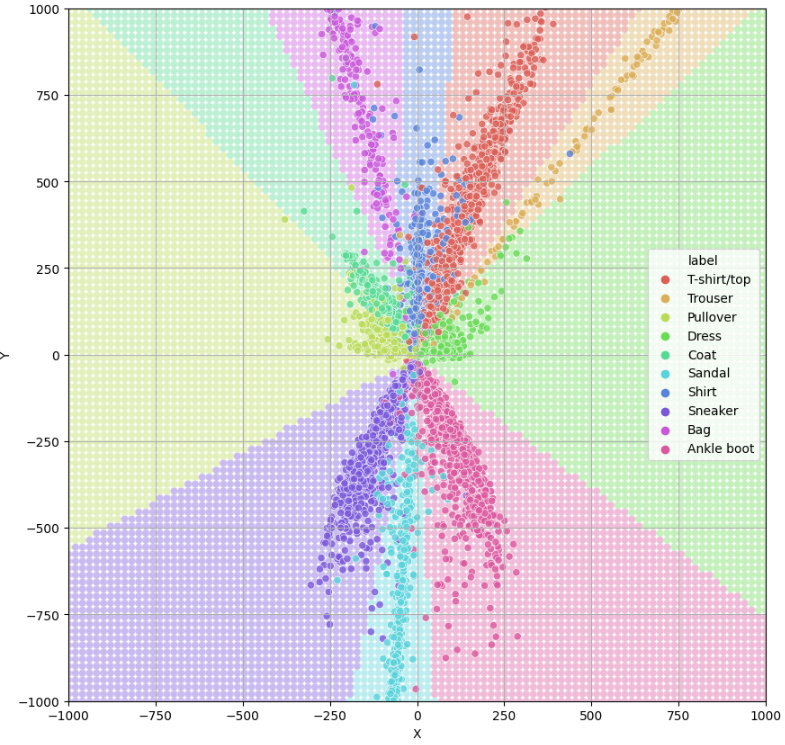

Pero tambien podemos ver que sucede si dicha capa tiene activacion relu.

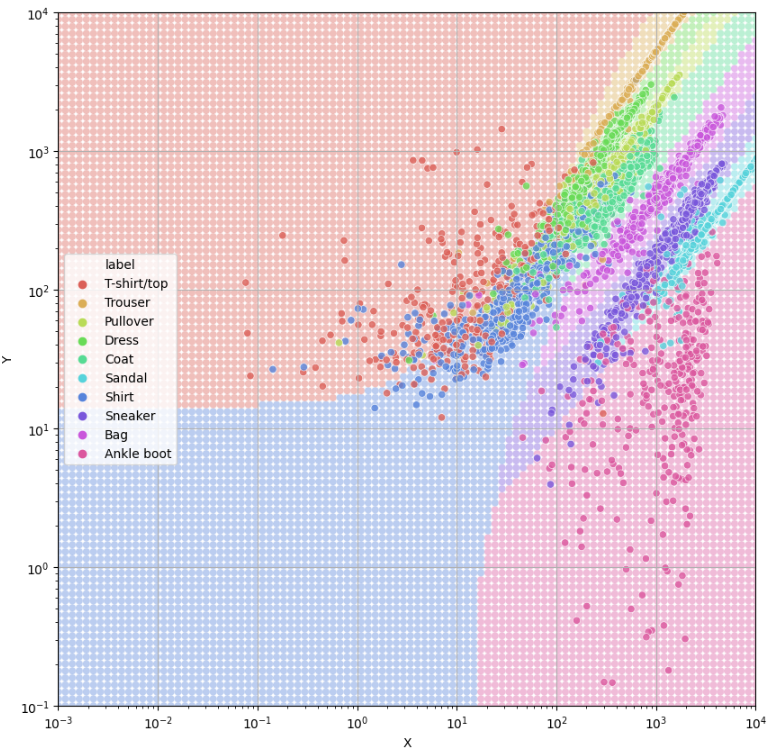

***
### Lotery Ticket


In [151]:

model = create_MLP_model('relu',1024,0,'glorot_normal')
model.compile(loss = 'categorical_crossentropy',optimizer=Nadam(learning_rate=0.001, decay = 0), metrics = ["accuracy"])
model.save('red1.h5')


model.fit(X_train_par, y_sparse_train,
                  batch_size=256,
                  epochs=10,
                  verbose=1,
                  validation_data=(X_val_par, y_sparse_val),
                  callbacks=[callback])

model.save('red2.h5')


Epoch 1/10
200/200 [==============================] - 13s 63ms/step - loss: 0.6315 - accuracy: 0.7699 - val_loss: 0.4372 - val_accuracy: 0.8334
Epoch 2/10
200/200 [==============================] - 14s 69ms/step - loss: 0.4698 - accuracy: 0.8334 - val_loss: 0.4226 - val_accuracy: 0.8474
Epoch 3/10
200/200 [==============================] - 18s 89ms/step - loss: 0.3410 - accuracy: 0.8723 - val_loss: 0.4217 - val_accuracy: 0.8534
Epoch 4/10
200/200 [==============================] - 21s 105ms/step - loss: 0.3046 - accuracy: 0.8856 - val_loss: 0.4527 - val_accuracy: 0.8489
Epoch 5/10
200/200 [==============================] - 21s 105ms/step - loss: 0.2798 - accuracy: 0.8951 - val_loss: 0.3388 - val_accuracy: 0.8788
Epoch 6/10
200/200 [==============================] - 21s 104ms/step - loss: 0.2620 - accuracy: 0.9014 - val_loss: 0.3758 - val_accuracy: 0.8643
Epoch 7/10
200/200 [==============================] - 21s 104ms/step - loss: 0.2445 - accuracy: 0.9075 - val_loss: 0.4714 - val_accur

In [152]:
red1 = keras.models.load_model('red1.h5')
red2 = keras.models.load_model('red2.h5')
red3 = keras.models.load_model('red1.h5')

In [153]:
weightred1 = red1.get_weights()
weightred2 = red2.get_weights()
weightred3 = red1.get_weights()

#### Flatten de todos los pesos de las capas y reduzco el 50% asi.

In [ ]:
#Los impares son los bias, por eso no se dividen entre el inical y el final.
varall = np.concatenate((np.abs((weightred2[0]-weightred1[0])).flatten()
                         ,np.abs((weightred2[1]-weightred1[1])).flatten()
                         ,np.abs((weightred2[2]-weightred1[2])).flatten()
                         ,np.abs((weightred2[3]-weightred1[3])).flatten()
                         ,np.abs((weightred2[4]-weightred1[4])).flatten()
                         ,np.abs((weightred2[5]-weightred1[5])).flatten()
                         ,np.abs((weightred2[6]-weightred1[6])).flatten()
                         ,np.abs((weightred2[7]-weightred1[7])).flatten()
                         ,np.abs((weightred2[8]-weightred1[8])).flatten()
                         ,np.abs((weightred2[9]-weightred1[9])).flatten()))

varall = chop_weights(varall,varall)

#los primeros 784*256
for i in range(varall.shape[0]):
    if i < (784*256):
        
        if varall[i] == 0:
            weightred3[0][int(i%784)][int(i/784)] = 0
        else:
            weightred3[0][int(i%784)][int(i/784)] = weightred1[0][int(i%784)][int(i/784)]
            
    elif i < (784*256) + 256:
        
        if varall[i] == 0:
            weightred3[1][int(i%256)] = 0
        else:
            weightred3[1][int(i%256)] =weightred1[1][int(i%256)]
            
    elif i < (784*256) + 256 + (256*256):
        
        if varall[i] == 0:
            weightred3[2][(i - ((784*256) + 256))%(256)][int((i - ((784*256) + 256))/256)] = 0
        else:
            weightred3[2][(i - ((784*256) + 256))%(256)][int((i - ((784*256) + 256))/256)] = weightred1[2][(i - ((784*256) + 256))%(256)][int((i - ((784*256) + 256))/256)] 
        
    elif i < (784*256) + 256 + (256*256) + 256:
        
        if varall[i] == 0:
            weightred3[3][(i - ((784*256) + 256 + (256*256)))%256] = 0
        else:
            weightred3[3][(i - ((784*256) + 256 + (256*256)))%256] =weightred1[3][(i - ((784*256) + 256 + (256*256)))%256] 
            
    elif i < (784*256) + 256 + (256*256) + 256 + (256*256):
        
        if varall[i] == 0:
            weightred3[4][(i - ((784*256) + 256 + (256*256) + 256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256))/256)] = 0
        else:    
            weightred3[4][(i - ((784*256) + 256 + (256*256) + 256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256))/256)]=weightred1[4][(i - ((784*256) + 256 + (256*256) + 256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256))/256)]
    
    elif i < (784*256) + 256 + (256*256) + 256 + (256*256) + 256:
        if varall[i] ==0:
            weightred3[5][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)))%256] = 0
        else:
            weightred3[5][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)))%256]=weightred1[5][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)))%256]
    
    elif i < (784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256):
        if varall[i] == 0:
            weightred3[6][(i - ((784*256) + 256 + (256*256) + 256 + (256*256) + 256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256 + (256*256) + 256))/256)] = 0
        else:
            weightred3[6][(i - ((784*256) + 256 + (256*256) + 256 + (256*256) + 256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256 + (256*256) + 256))/256)]=weightred1[6][(i - ((784*256) + 256 + (256*256) + 256 + (256*256) + 256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256 + (256*256) + 256))/256)]
    
    elif i < (784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256:
        if varall[i] == 0:
            weightred3[7][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)))%256] = 0
        else:
            weightred3[7][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)))%256]=weightred1[7][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)))%256]
            
    elif i < (784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256+(256*10):
        if varall[i] == 0:
            weightred3[8][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256))/256)] = 0
        else:
            weightred3[8][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256))/256)]=weightred1[8][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256))%(256)][int((i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256))/256)]
    
    elif i < (784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256+(256*10)+10:
        if varall[i] == 0:
            weightred3[9][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256+(256*10)))%10] = 0
        else:
            weightred3[9][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256+(256*10)))%10]=weightred1[9][(i - ((784*256) + 256 + (256*256) + 256 + (256*256)+ 256 + (256*256)+256+(256*10)))%10]
        
    else:
        break
red3.set_weights(weightred3) 
y_red3 = red3.predict(X_val_par)
prediction = np.zeros(X_val_par.shape[0]).astype(int)
for k in range(X_val_par.shape[0]):
        prediction[k] = np.argmax(y_red3[k])
c = 0
for i in range(X_val_par.shape[0]):
    if(y_val_par[i] == prediction[i]):
        c+=1
        
print("result = ", c/X_val_par.shape[0])

#### Capa por capa me quedo con el n% de los pesos 

In [67]:
def chop_weights(var,arrToShape):
    indices_ordenados = np.argsort(var)
    mitad = (len(indices_ordenados))// 2
    print(indices_ordenados)
    arrToShape[indices_ordenados[:mitad]] = 0
    
def conserve_higher_half(array):
    sorted_array = sorted(array, reverse=True)
    midpoint = len(sorted_array)// 2
    higher_half = sorted_array[midpoint:]

    result = []
    for value in array:
        if value in higher_half:
            result.append(value)
        else:
            result.append(0)

    return result

In [213]:

variations = list()
for i in [0,2,4,6]:
    variations.append(np.abs(weightred2[i]-weightred1[i]))

for i in range(4):
    for j in range(weightred3[2*i].shape[0]):
        aux = conserve_higher_half(variations[i][j])
        for k in range(len(variations[i][j])):
            if variations[i][j][k] == 0:
                weightred3[2*i][j][k] = 0
len(variations[0][0] == 0)
    

256

In [68]:
red3.set_weights(weightred3)

In [225]:
y_red3 = red1.predict(X_val_par)
print(y_red3)

282/282 [==============================] - 0s 1ms/step
[[0.09179585 0.10647308 0.10119734 ... 0.09311043 0.10022507 0.10568661]
 [0.09749135 0.11091825 0.10107186 ... 0.09312407 0.09952071 0.09913278]
 [0.09702419 0.10576416 0.10013884 ... 0.09565508 0.0968337  0.10179739]
 ...
 [0.09319323 0.11533721 0.10198452 ... 0.08676887 0.10575616 0.09702226]
 [0.09658025 0.10468291 0.09971263 ... 0.09498589 0.09953319 0.10284353]
 [0.09546882 0.10573151 0.10132007 ... 0.09282377 0.10035987 0.10158773]]


In [154]:
red3.evaluate(X_val_par, y_sparse_val)

282/282 [==============================] - 2s 8ms/step - loss: 2.3017 - accuracy: 0.0593


[2.301698684692383, 0.059333331882953644]

In [155]:
aux=np.hstack([x.flatten() for x in red2.get_weights()])
aux2=np.hstack([x.flatten() for x in red1.get_weights()])
n = sum(np.abs(aux-aux2) > 0.01)/len(aux)
print(n)

0.5277756889542733


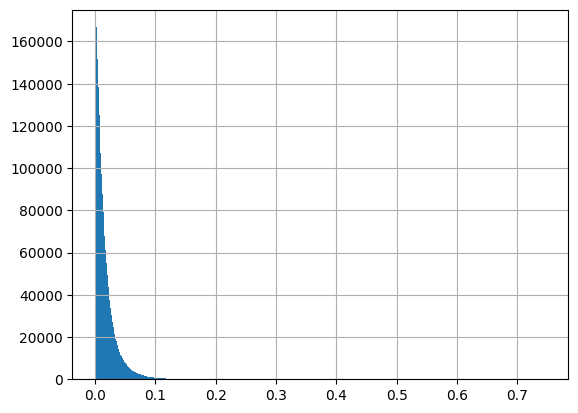

In [156]:
plt.hist(np.abs(aux-aux2),bins=1000);
plt.grid(True)

In [161]:
variations = list()
for i in range(10):
    variations.append(np.abs(weightred2[i]-weightred1[i]))

In [162]:
mask = [x > 0.015 for x in variations]

In [163]:
new_weights = [x*m for x,m in zip(mask,red1.get_weights())]

In [164]:
red3.set_weights(new_weights)

In [165]:
red3.evaluate(X_val_par, y_sparse_val)

282/282 [==============================] - 2s 8ms/step - loss: 2.3011 - accuracy: 0.1004


[2.301074981689453, 0.10044444352388382]

In [166]:
class CustomCallback(keras.callbacks.Callback):
    def on_train_batch_begin(self, batch, logs=None):
        keys = list(logs.keys())
        new_weights = [x*m for x,m in zip(mask,red3.get_weights())]
        red3.set_weights(new_weights)

    def on_train_batch_end(self, batch, logs=None):
        keys = list(logs.keys())
        new_weights = [x*m for x,m in zip(mask,red3.get_weights())]
        red3.set_weights(new_weights)

In [ ]:
#Esto modifica las pesos, no se como cortar para que siempre sean cero los que arrancan en cero.
red3.fit(X_train_par, y_sparse_train,
                  batch_size=256,
                  epochs=100,
                  verbose=1,
                  validation_data=(X_val_par, y_sparse_val),
                  callbacks=[CustomCallback()])

pepe = red3.get_weights()

In [168]:
print(pepe)

[array([[-0.        ,  0.16591004, -0.        , ...,  0.        ,
         0.        , -0.        ],
       [ 0.        ,  0.05492407, -0.        , ...,  0.09364387,
         0.        , -0.        ],
       [-0.        ,  0.        , -0.01390245, ...,  0.04432743,
        -0.        ,  0.        ],
       ...,
       [-0.00176193,  0.        , -0.        , ...,  0.07069358,
         0.        ,  0.        ],
       [ 0.        , -0.        ,  0.15603617, ...,  0.06784613,
        -0.30201033, -0.05494051],
       [-0.        , -0.13077134,  0.        , ...,  0.0403167 ,
         0.        ,  0.        ]], dtype=float32), array([-0.0000000e+00,  9.8423295e-02,  2.9522015e-04, ...,
        3.5858825e-01,  0.0000000e+00,  0.0000000e+00], dtype=float32), array([[ 0.01515062, -0.08092528,  0.05992443, ..., -0.        ,
         0.07551038,  0.02985649],
       [-0.        , -0.        , -0.        , ...,  0.07843412,
         0.        , -0.        ],
       [-0.        , -0.        ,  0. 

******
******
******
******
## MNIST Dataset
***
***
***
***


In [336]:
from tensorflow.keras.datasets import mnist
import pandas as pd
(x_train, y_train) , (x_test, y_test) = mnist.load_data()
train_morpho = pd.read_csv("Data/train-morpho.csv")
test_morpho = pd.read_csv("Data/t10k-morpho.csv")

In [337]:
x_train = x_train/255
x_test = x_test/255


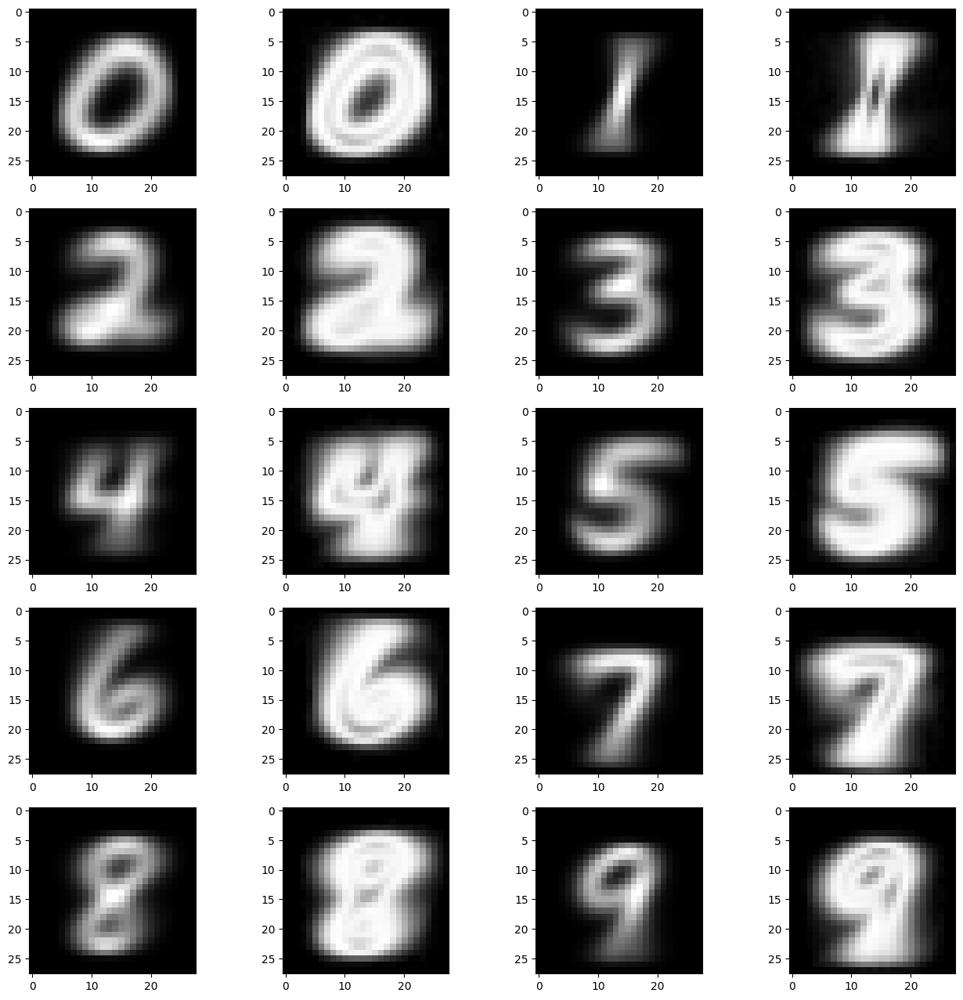

In [338]:
#Mean and Variance of all clases.
all_clases_mean = np.zeros([10,784])
all_clases_var = np.zeros([10,784])
plt.figure(figsize=(16,16))
for i in range(1,11):
    s_train = x_train[y_train== i-1, ...] 
    all_clases_mean[i-1] = s_train.mean(axis=0).flatten()
    all_clases_var[i-1] = s_train.std(axis=0).flatten()
    plt.subplot(5,4,2*i - 1)
    a = plt.imshow(s_train.mean(axis=0), cmap='gray')
    plt.subplot(5,4,2*i)
    b = plt.imshow(s_train.std(axis=0), cmap='gray')

In [339]:
all_morpho_per_class = []
for i in range(10):
    all_morpho_per_class.append(train_morpho[y_train == i])
all_morpho_per_class[2]

,index,area,length,thickness,slant,width,height
5,5,117.5000,55.691125,2.390478,0.299495,18.115126,16.513803
16,16,99.0000,54.438077,2.066260,0.212531,17.952107,17.889781
25,25,159.5000,54.948485,3.192670,0.124199,16.947368,19.243413
28,28,164.7500,48.723611,3.608880,-0.215995,16.987413,19.687740
76,76,102.5625,45.773864,2.375486,-0.191486,16.290434,18.890335
...,...,...,...,...,...,...,...
59971,59971,121.8125,56.466252,2.547267,0.503427,16.224405,17.891348
59974,59974,91.2500,50.162951,2.093765,0.617308,16.993882,17.308997
59983,59983,109.4375,34.513456,3.208985,0.608134,15.898354,15.830856
59985,59985,137.3750,48.602291,3.089784,0.562262,17.568367,18.680422


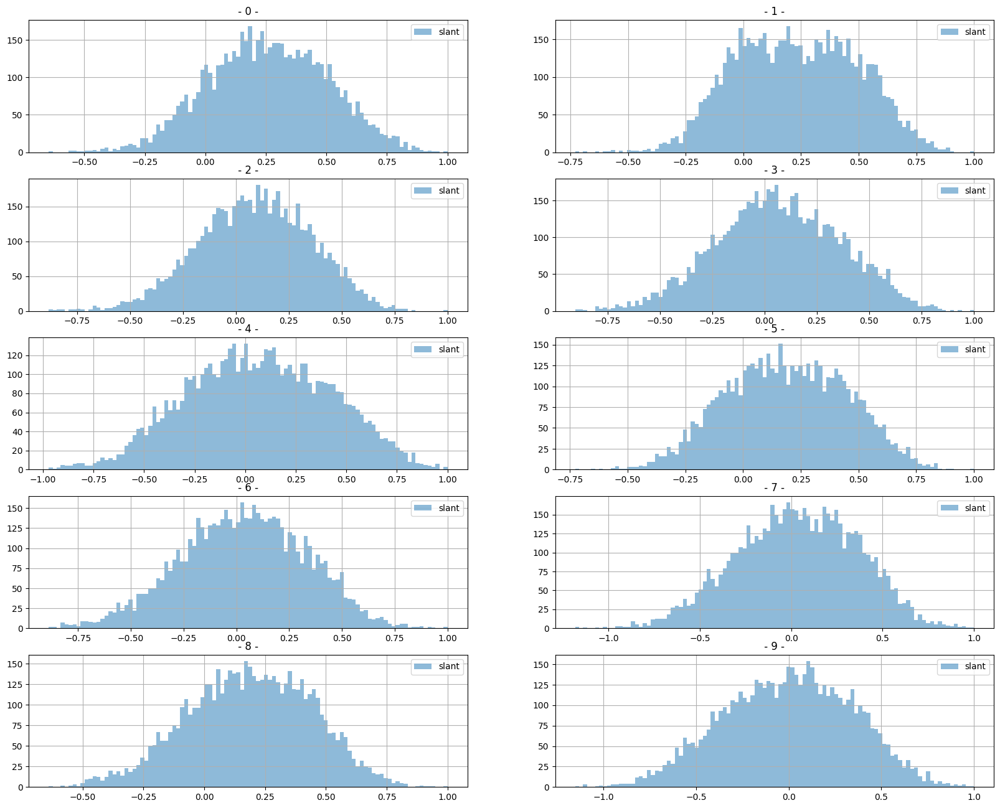

In [340]:
label_morpho = ['slant']
plt.figure(figsize=(20,16))
for i in range(1,6):
    plt.subplot(5,2,2*i - 1)
    for k in range(len(label_morpho)):
        a = plt.hist(all_morpho_per_class[2*i-2][label_morpho[k]].values/np.max(all_morpho_per_class[2*i-2][label_morpho[k]].values) , bins=100,label = label_morpho[k] ,alpha = 0.5)
    plt.title(" - " + str(2*i-2)+ " - ")
    plt.grid(True)
    plt.legend()
    plt.subplot(5,2,2*i)
    for k in range(len(label_morpho)):
        b = plt.hist(all_morpho_per_class[2*i-1][label_morpho[k]].values/np.max(all_morpho_per_class[2*i-1][label_morpho[k]].values) , bins=100,label = label_morpho[k],alpha = 0.5)
    plt.title(" - " + str(2*i-1)+ " - ")
    plt.grid(True)
    plt.legend()

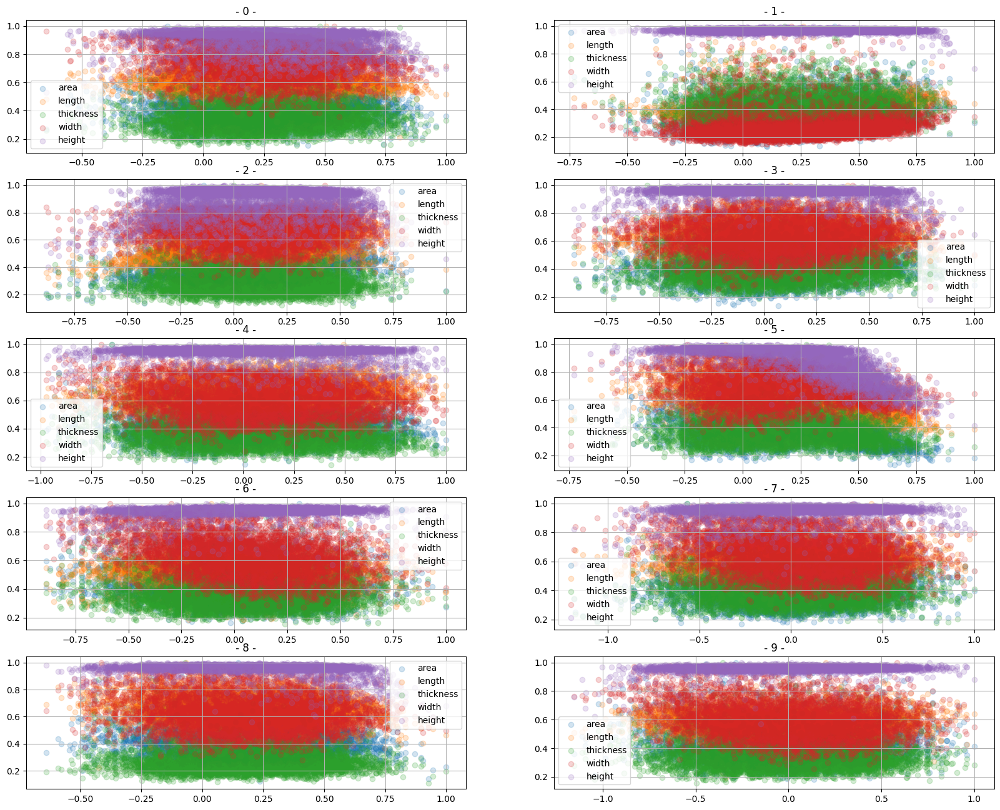

In [341]:
label_morpho_scatter = ['area','length','thickness','width','height']

plt.figure(figsize=(20,16))
for i in range(1,6):
    plt.subplot(5,2,2*i - 1)
    for k in range(len(label_morpho_scatter)):
        a = plt.scatter(x = all_morpho_per_class[2*i-2]['slant'].values/np.max(all_morpho_per_class[2*i-2]['slant'].values)
                        ,y=all_morpho_per_class[2*i-2][label_morpho_scatter[k]].values/np.max(all_morpho_per_class[2*i-2][label_morpho_scatter[k]].values)
                        ,label = label_morpho_scatter[k]
                        ,alpha = 0.2)
    plt.title(" - " + str(2*i-2)+ " - ")
    plt.grid(True)
    plt.legend()
    plt.subplot(5,2,2*i)
    for k in range(len(label_morpho_scatter)):
        b =  plt.scatter(x = all_morpho_per_class[2*i-1]['slant'].values/np.max(all_morpho_per_class[2*i-1]['slant'].values)
                         ,y=all_morpho_per_class[2*i-1][label_morpho_scatter[k]].values/np.max(all_morpho_per_class[2*i-1][label_morpho_scatter[k]].values)
                         ,label = label_morpho_scatter[k]
                         ,alpha = 0.2)
    plt.title(" - " + str(2*i-1)+ " - ")
    plt.grid(True)
    plt.legend()

No obstante no queda claro cual es el dato que posee la mayor correlación con el slant, por ende hay que recurrir al factor de correlación para poder discernir entre los datos y elegir el mejor para este caso.

In [342]:
list_corrcoef= []
aux = []
for j in range(10):
    for i in range(5):         
        aux.append(np.abs(np.corrcoef(x=all_morpho_per_class[j]['slant'],y=all_morpho_per_class[j][label_morpho_scatter[i]])[0][1]))
    
    list_corrcoef.append([np.max(aux),np.argmax(aux)])
    aux.clear()
list_corrcoef

[[0.17837841657357664, 4],
 [0.24908275396497281, 1],
 [0.2831375127330651, 1],
 [0.1115240686470318, 4],
 [0.21140849486579427, 1],
 [0.6847738996176513, 4],
 [0.35678945757856395, 3],
 [0.24507611573624644, 3],
 [0.23097053347494897, 4],
 [0.2183438765470955, 3]]

Entonces, el parametro continuo que se eligio fue el width.

***
En este caso ya no es necesario tener que splitear la data en de train en (train, test), pues ya se nos otorga ambos.

Ahora lo que queremos es establecer la inclinación en base a la imagen.

Despues de haber probado varias combinaciones, la que resulto tener mejor performance es la siguiente. Ahora vamos a variar los hiperparametros como lo habiamos hecho para el anterior dataset.

In [343]:
def creat_MLP_model_mnist(activation,kernel_initializer,dropOut):
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28, 1)))
    model.add(Dense(512, activation=activation,kernel_initializer=kernel_initializer))
    model.add(Dropout(dropOut))
    model.add(Dense(512, activation=activation,kernel_initializer=kernel_initializer))
    model.add(Dropout(dropOut))
    model.add(Dense(1,activation = 'linear',kernel_initializer=kernel_initializer))
    return model
callback = EarlyStopping(monitor='val_MAE',min_delta=0, patience=40,restore_best_weights=True)    

Probemos que sucede cuando la funcion de costo es el MSE y el MAE

In [ ]:
hist_arr = []
for i in ['mae','mse']:
    model = creat_MLP_model_mnist('sigmoid','glorot_normal',0.2)
    history = compile_MLP_model(model = model,
                                learning_rate_choice=0.001,
                                     lossFunc=i,
                                     optimizer='adam',
                                     x_train=x_train,
                                     y_train=train_morpho['slant'].values,
                                     x_val=x_test,
                                     y_val =  test_morpho['slant'].values,
                                     numEpoch= 100,
                                     batch_size=256,
                                     metric='MAE')
    hist_arr.append(history)


In [ ]:
plt.figure(figsize=(12,8))
epoch_count0 = range(1,len(hist_arr[0].history['MAE']) + 1)
epoch_count1 = range(1,len(hist_arr[1].history['MAE']) + 1)
sns.lineplot(x=epoch_count0, y = hist_arr[0].history['MAE'],label = 'MAE - MAE loss')
sns.lineplot(x=epoch_count0, y = hist_arr[0].history['val_MAE'],label = 'validation MAE - MAE loss')
sns.lineplot(x=epoch_count1, y = hist_arr[1].history['loss'],label = 'loss - MSE loss')
sns.lineplot(x=epoch_count1, y = hist_arr[1].history['val_loss'],label = 'validation loss - MSE loss')
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.grid()
plt.show()

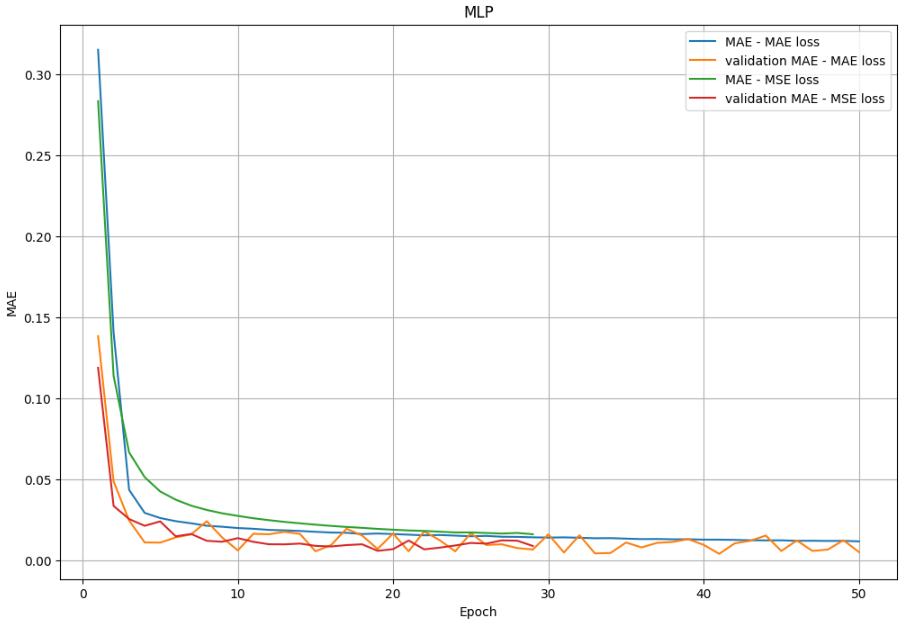

De este entrenamiento, vemos que no tienen mucha diferencia en funcion de la loss, lo que si podemos observar es que al tener como los el propio MAE, no salto el early stopping alcanzando valores menores de MAE que cuando la funcion loss fue el MSE, otra de las desventajas del MSE es que el valor de la loss era demasiado pequeño como se observa en el siguiente grafico.

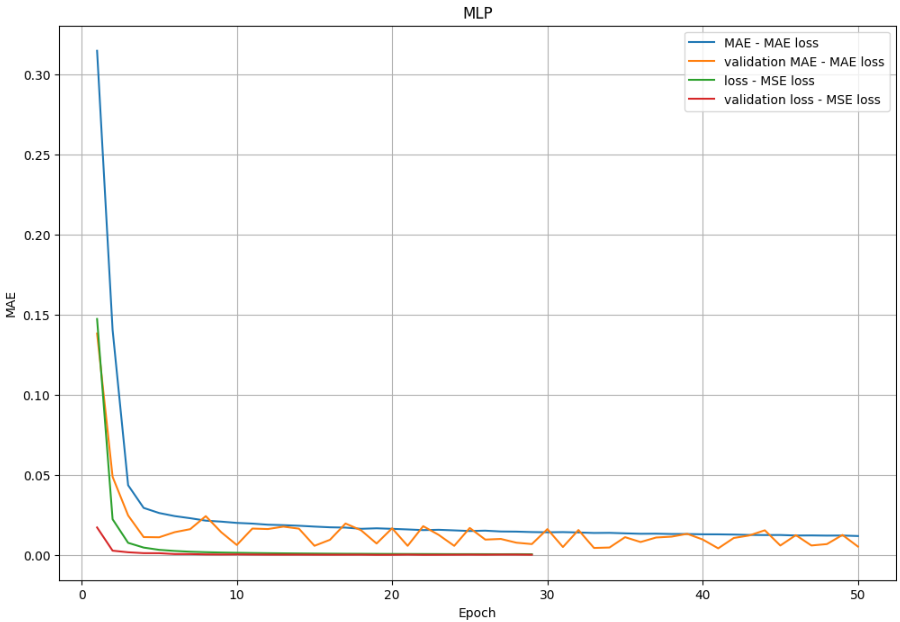

Por esto ultimo y lo anterior mencionado, se decidio hacer uso de MAE como funcion de loss.
***

Variemos el learning rate.

In [ ]:
cant_iter = 10
mae = np.zeros(cant_iter)
lra = np.zeros(cant_iter)
hist = []
numEpoch = 50
for i in range(cant_iter):
    pesoInit = 'glorot_normal' 
    dropOut = 0.2
    activation ='sigmoid'
    batch_size = 128
    learning_rate_choice = 0.01 * np.exp(-0.4*i)
    model = creat_MLP_model_mnist(activation,pesoInit,dropOut)
    history = compile_MLP_model(model = model,
                                learning_rate_choice=learning_rate_choice,
                                     lossFunc='mae',
                                     optimizer='nadam',
                                     x_train=x_train,
                                     y_train=train_morpho['slant'].values,
                                     x_val=x_test,
                                     y_val =  test_morpho['slant'].values,
                                     numEpoch= numEpoch,
                                     batch_size=batch_size,
                                     metric='MAE')
    hist.append(history)
    mae[i] = np.min(history.history['val_MAE'])
    lra[i] = learning_rate_choice

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = lra , y = mae, label = 'Epochs = %d lr = %0.4f batchSize = %d DropOut = %0.2f \n Optm: %s  Actv: %s   InitPesos: %s' %(numEpoch,learning_rate_choice,batch_size,dropOut,optimizer,activation,pesoInit))
plt.xlabel("Learning rate")
plt.ylabel("MAE")
plt.title("MAE vs lr")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12,8))
for k in range(cant_iter):
    sns_val_MAE(hist[k],k,lra[k])
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.grid()
plt.show()  

Los resultados obtenidos, fueron los siguientes.

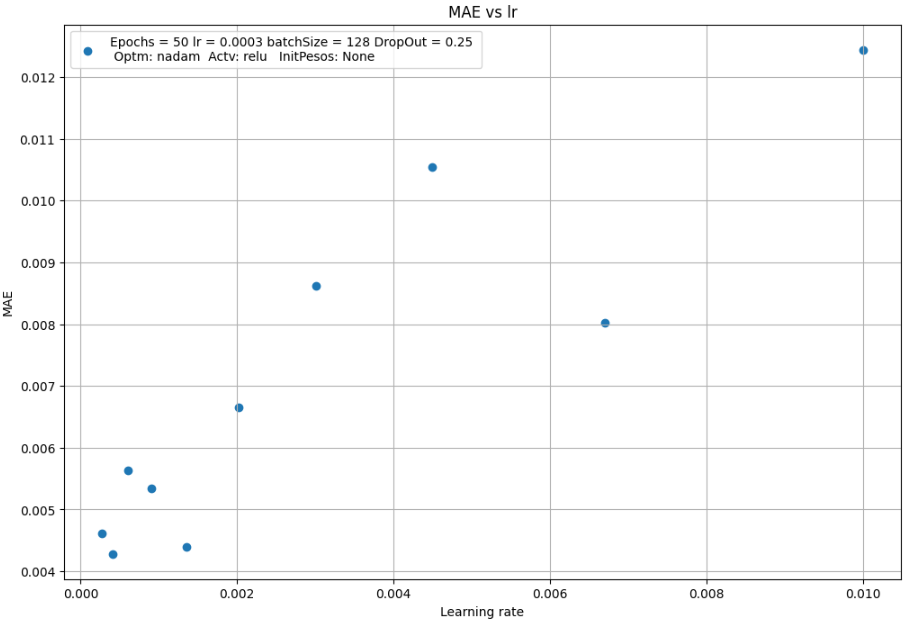

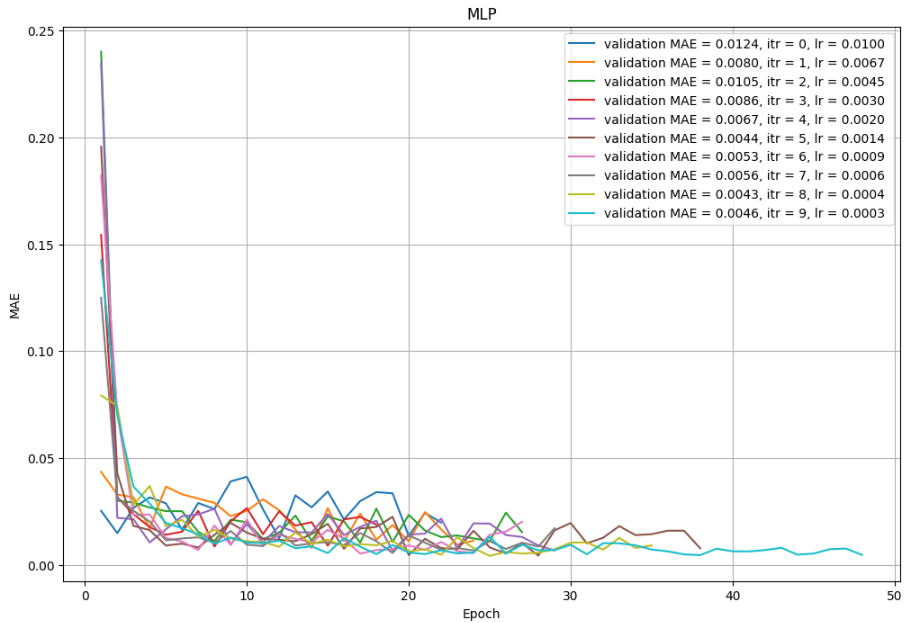

Cuanto menor el learning rate, mayor cantidad de epochs para que salte el early stopping, pero menor valor de MAE se obtiene por esto ultimo se elijio un $LR = 0.0004$ 
***

Ahora variemos el batch size

In [ ]:
cant_iter = 10
mae = np.zeros(cant_iter)
bs = np.zeros(cant_iter)
hist = []
for i in range(cant_iter):
    pesoInit = 'glorot_normal' 
    dropOut = 0.2
    numEpoch = 50
    activation ='sigmoid'
    batch_size = 8*(2**i)
    learning_rate_choice = 0.0004
    model = creat_MLP_model_mnist(activation,pesoInit,dropOut)
    history = compile_MLP_model(model = model,
                                learning_rate_choice=learning_rate_choice,
                                     lossFunc='mae',
                                     optimizer='nadam',
                                     x_train=x_train,
                                     y_train=train_morpho['slant'].values,
                                     x_val=x_test,
                                     y_val =  test_morpho['slant'].values,
                                     numEpoch= numEpoch,
                                     batch_size=batch_size,
                                     metric='MAE')
    hist.append(history)
    mae[i] = np.min(history.history['val_MAE'])
    bs[i] = batch_size

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(x = np.log2(bs) , y = mae, label = 'Epochs = %d lr = %0.4f batchSize = %d DropOut = %0.2f \n Optm: %s  Actv: %s   InitPesos: %s' %(numEpoch,learning_rate_choice,batch_size,dropOut,optimizer,activation,pesoInit))
plt.xlabel("batch size")
plt.ylabel("MAE")
plt.title("MAE vs bs")
plt.legend()
plt.grid(True)

In [ ]:
plt.figure(figsize=(12,8))
for k in range(cant_iter):
    sns_val_MAE(hist[k],k,bs[k])
plt.title("MLP")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.grid()
plt.show()  

Los resultados fueron los siguiente.

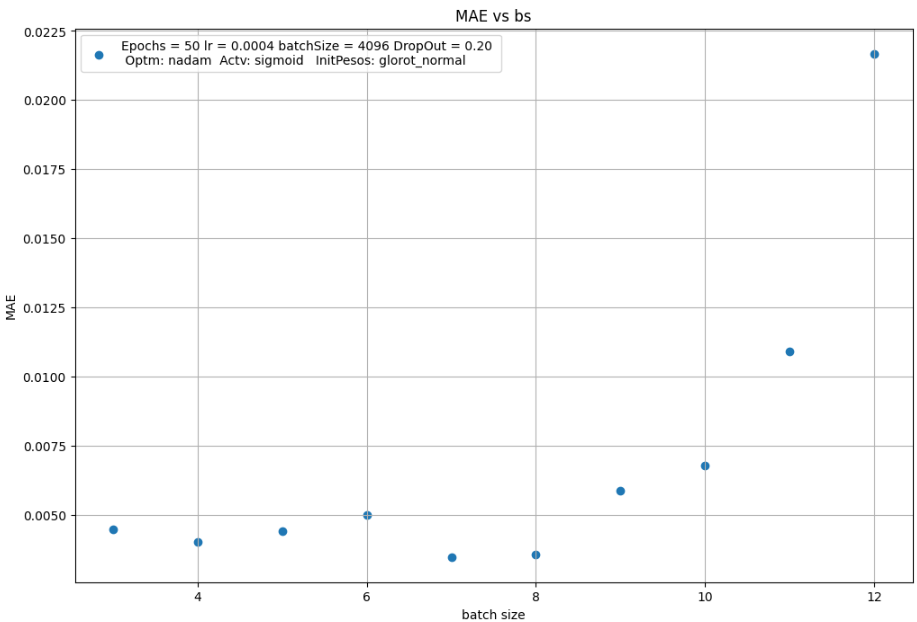

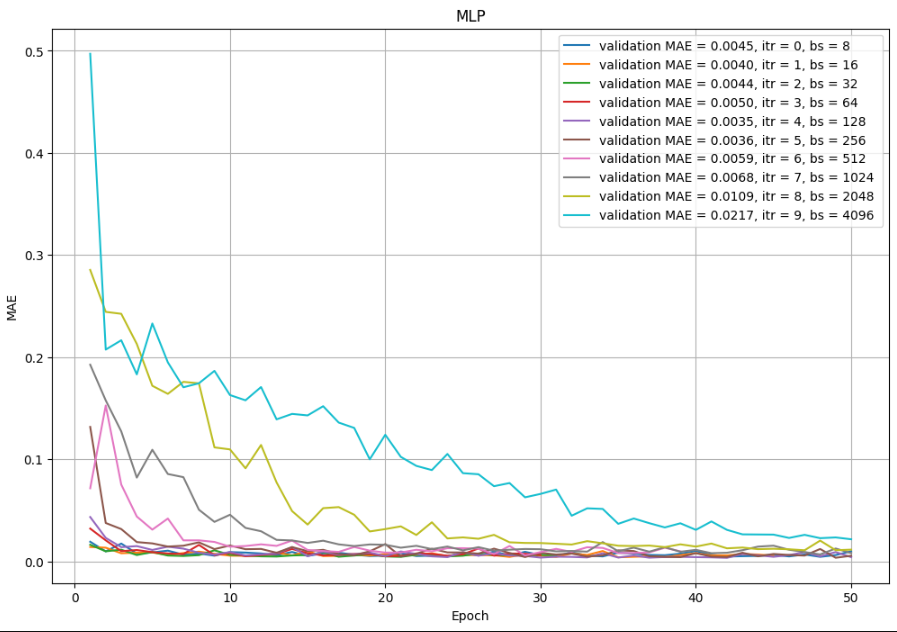

Finalmente se decidio usar un batch size de 256 pues es el que mejor resulta en relacion MAE tiempo de entrenameiento.

Luego se realizaron los mismos test que en el dataset anterior, en donde se obtiveron que los mejores hiperparametros son:

    pesoInit = glorot_normal 
    dropout rate = 0.2
    funcion de activacion = sigmoid
    batch size  = 256
    learning_rate_choice = 0.0004
    optimezer = Adam

Ahora vamos a realizar el embedding con el label.

Embedding

In [ ]:
pesoInit = 'glorot_normal' 
dropOut = 0.2
activation ='sigmoid'
batch_size = 256
image_input = Input(shape=(28, 28)) 
flatten_image = Flatten()(image_input)
label_input = Input(shape=(1,))
embedding2 = Embedding(10,2,input_length = 1)(label_input)
flatten_emb = Flatten()(embedding2)
concatenated = concatenate([flatten_image, flatten_emb])
h1 = Dense(512, activation=activation,kernel_initializer=pesoInit)(concatenated)
h2 = Dropout(dropOut)(h1)
h3 = Dense(512, activation=activation,kernel_initializer=pesoInit)(h2)
h4 = Dropout(dropOut)(h3)
output = Dense(1,activation = 'linear',kernel_initializer=pesoInit)(h4)
model = Model(inputs=[image_input, label_input], outputs=output)
model.summary()
history = compile_MLP_model(model = model,
                                learning_rate_choice=0.0004,
                                     lossFunc='mae',
                                     optimizer='adam',
                                     x_train=[x_train,y_train],
                                     y_train=train_morpho['slant'].values,
                                     x_val=[x_test,y_test],
                                     y_val =  test_morpho['slant'].values,
                                     numEpoch= 200,
                                     batch_size=batch_size,
                                     metric='MAE')

Funciona levemente mejor que si no hubiesemos puesto el embedding del label.

In [ ]:
embedding_weights = model.get_layer(name='embedding').get_weights()

In [ ]:
plt.figure(figsize=(12,8))
for i in range(10):
    plt.scatter(x=embedding_weights[0][i,0],y=embedding_weights[0][i,1],label=i)
plt.legend()
plt.title('Pesos del embedding de 2 dimensiones')
plt.grid(True)
plt.show()

El resultado obtenido de los pesos del embedding luego del training, fueron los siguientes:

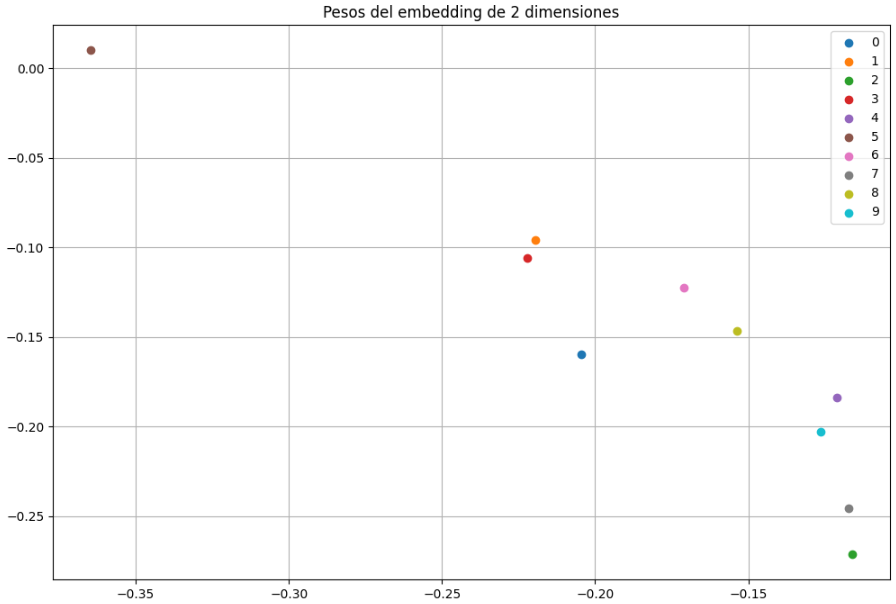

Lo cual en principio es dificl de explicar, pues la distancia que separa al uno del siete es demasiado grande teniendo en cuenta lo similares que son. Pero si observabos con delicadeza los mean values por clase obtenidos al principio del análisis de este dataset, vemos con claridad que el uno y el siete si que son realmente diferentes. 

Siguiendo el razonamiento anterior, se pueden deducir la distancia entre los demas puntos del grafico.

Ahora, nos piden poner de input otra variable continua con la que mayor se correlacionan los datos para poder mejorar el valor del mae.

Como se hallo previamente, la varible que mas se correlaciona es el width.

In [ ]:
pesoInit = 'glorot_normal' 
dropOut = 0.2
activation ='sigmoid'
batch_size = 256
image_input = Input(shape=(28, 28)) 
flatten_image = Flatten()(image_input)
cont_input = Input(shape=(1,))
concatenated = concatenate([flatten_image, cont_input])
h1 = Dense(512, activation=activation,kernel_initializer=pesoInit)(concatenated)
h2 = Dropout(dropOut)(h1)
h3 = Dense(512, activation=activation,kernel_initializer=pesoInit)(h2)
h4 = Dropout(dropOut)(h3)
output = Dense(1,activation = 'linear',kernel_initializer=pesoInit)(h4)

model = Model(inputs=[image_input, cont_input], outputs=output)
model.summary()
history = compile_MLP_model(model = model,
                                learning_rate_choice=0.0004,
                                     lossFunc='mae',
                                     optimizer='adam',
                                     x_train=[x_train,train_morpho['width'].values],
                                     y_train=train_morpho['slant'].values,
                                     x_val=[x_test,test_morpho['width'].values],
                                     y_val =  test_morpho['slant'].values,
                                     numEpoch= 200,
                                     batch_size=batch_size,
                                     metric='MAE')

Lo ultimo que quiero probar, es que sucede si normalizo el valor de entrada del width dado que es un input tal y como lo es el valor de los pixeles. Como tambien pasamos el valor del slant a grados.

In [ ]:
pesoInit = 'glorot_normal' 
dropOut = 0.2
activation ='sigmoid'
batch_size = 256
image_input = Input(shape=(28, 28)) 
flatten_image = Flatten()(image_input)
cont_input = Input(shape=(1,))
concatenated = concatenate([flatten_image, cont_input])
h1 = Dense(512, activation=activation,kernel_initializer=pesoInit)(concatenated)
h2 = Dropout(dropOut)(h1)
h3 = Dense(512, activation=activation,kernel_initializer=pesoInit)(h2)
h4 = Dropout(dropOut)(h3)
output = Dense(1,activation = 'linear',kernel_initializer=pesoInit)(h4)

model = Model(inputs=[image_input, cont_input], outputs=output)
model.summary()
history = compile_MLP_model(model = model,
                                learning_rate_choice=0.0004,
                                     lossFunc='mae',
                                     optimizer='adam',
                                     x_train=[x_train,train_morpho['width'].values/np.max(train_morpho['width'].values)],
                                     y_train=train_morpho['slant'].values*180/np.pi,
                                     x_val=[x_test,test_morpho['width'].values/np.max(test_morpho['width'].values)],
                                     y_val =  test_morpho['slant'].values*180/np.pi,
                                     numEpoch= 200,
                                     batch_size=batch_size,
                                     metric='MAE')

Funciona igual que antes.

A continuacion dejo como hacer un tuner para obetenre un buen modelo para la competicion.

In [289]:
from keras import backend as K
K.clear_session()

In [291]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch

x_train = np.load("Data/train_images.npy")
y_train = pd.read_csv("Data/train_labels.csv")

x_train = np.expand_dims(x_train, axis=-1)

# Define the model building function
def build_model(hp):
    model = keras.Sequential()
    
    model.add(layers.Conv2D(
        filters=hp.Int('filters', 32, 512, 16),
        kernel_size=hp.Choice('kernel_size', values=[3, 5]),
        activation='relu',
        kernel_initializer='glorot_normal',
        input_shape=(28, 28, 1)
    ))
    
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Dropout(hp.Choice('dropoutRate',[0.15,0.2,0.25,0.3,0.35])))

    model.add(layers.Flatten())
    for i in range(hp.Int('num_layers', 1, 4)):
        model.add(layers.Dense(
            units=hp.Int('dense_units', 32, 512, 32),
            activation='relu',
            kernel_initializer='glorot_normal'
        ))
        model.add(Dropout(hp.Choice('dropoutRate',[0.15,0.2,0.25,0.3,0.35])))
        
    model.add(layers.Dense(10, activation='softmax',kernel_initializer='glorot_normal'))

    model.compile(optimizer=keras.optimizers.Adam(
        hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4]),decay=0),
        loss='categorical_crossentropy',
        metrics=['accuracy'])

    return model


# Instantiate the tuner
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=100,
    executions_per_trial=3,
    directory='my_dir',
    project_name='Competicion'
)

# Perform the hyperparameter search
tuner.search(x_train/255, np.eye(10)[y_train['label']], epochs=3, validation_split=0.1)


Trial 100 Complete [00h 18m 17s]
val_accuracy: 0.8827333450317383

Best val_accuracy So Far: 0.9102666775385538
Total elapsed time: 1d 07h 12m 31s
INFO:tensorflow:Oracle triggered exit


In [ ]:
best_model = tuner.get_best_models()[0]
best_model.summary()

x_train = np.load("Data/train_images.npy")
y_train = pd.read_csv("Data/train_labels.csv")

x_train = np.expand_dims(x_train, axis=-1)


In [ ]:
reduceLR=ReduceLROnPlateau(monitor='val_accuracy', 
                           factor=0.2, 
                           patience=8, 
                           verbose=1, 
                           min_delta=0, 
                           cooldown=0, min_lr=0)
callback = EarlyStopping(monitor='val_loss',min_delta=0, patience=30,restore_best_weights=True)
best_model.compile(optimizer=keras.optimizers.Nadam(
        learning_rate=1e-4,decay=0),
        loss='categorical_crossentropy',
        metrics=['accuracy'])
best_model.fit(x_train/255, np.eye(10)[y_train['label']], epochs=100, validation_split=0.1,batch_size=512,
                      callbacks=[callback,reduceLR])